In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
%matplotlib inline

Camera calibration images: ['camera_cal\\calibration1.jpg', 'camera_cal\\calibration10.jpg', 'camera_cal\\calibration11.jpg', 'camera_cal\\calibration12.jpg', 'camera_cal\\calibration13.jpg', 'camera_cal\\calibration14.jpg', 'camera_cal\\calibration15.jpg', 'camera_cal\\calibration16.jpg', 'camera_cal\\calibration17.jpg', 'camera_cal\\calibration18.jpg', 'camera_cal\\calibration19.jpg', 'camera_cal\\calibration2.jpg', 'camera_cal\\calibration20.jpg', 'camera_cal\\calibration3.jpg', 'camera_cal\\calibration4.jpg', 'camera_cal\\calibration5.jpg', 'camera_cal\\calibration6.jpg', 'camera_cal\\calibration7.jpg', 'camera_cal\\calibration8.jpg', 'camera_cal\\calibration9.jpg']
Grayscale image size: (1280, 720)


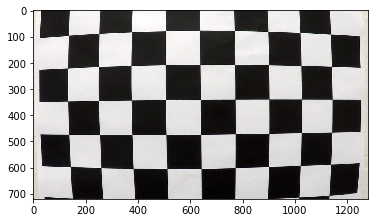

In [2]:
# Get all camera calibration images
all_img = glob.glob('camera_cal/calibration*.jpg')
print("Camera calibration images:", all_img)
img = mpimg.imread(all_img[0])
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  
img_size = gray.shape[::-1]
print("Grayscale image size:", img_size)
plt.imshow(img)

In [3]:
# Initialize object points and image points arrays
objpoints = []
imgpoints = []
processed_images = []
# Some images have 9x5 corners to detect, some 9x6
# We have to assume both scenarios for each image
objp_9x6 = np.zeros([6*9,3], np.float32)
objp_9x6[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
objp_9x5 = np.zeros([5*9,3], np.float32)
objp_9x5[:,:2] = np.mgrid[0:9,0:5].T.reshape(-1,2)

In [4]:
# Go through all images and detect corners
count_images_taken = 0
for img_name in all_img:
    img = mpimg.imread(img_name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  
    # First try to find 9x6 corners, and if that doesn't work, then
    # try to find 9x5. 
    # If none of those work, which is the case for 2 images, skip them
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp_9x6)
        processed_images.append(img)
    else:
        ret, corners = cv2.findChessboardCorners(gray, (9,5), None)
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp_9x5)
            processed_images.append(img)
    # Print image name and the detection flag, so that 
    # we know if the image was taken into account or not 
    if ret == True:
        count_images_taken += 1
    print("Detected corners in the image " + img_name + "? " + str(ret))
    
print("Added points from " + str(count_images_taken) + " images")  

Detected corners in the image camera_cal\calibration1.jpg? True
Detected corners in the image camera_cal\calibration10.jpg? True
Detected corners in the image camera_cal\calibration11.jpg? True
Detected corners in the image camera_cal\calibration12.jpg? True
Detected corners in the image camera_cal\calibration13.jpg? True
Detected corners in the image camera_cal\calibration14.jpg? True
Detected corners in the image camera_cal\calibration15.jpg? True
Detected corners in the image camera_cal\calibration16.jpg? True
Detected corners in the image camera_cal\calibration17.jpg? True
Detected corners in the image camera_cal\calibration18.jpg? True
Detected corners in the image camera_cal\calibration19.jpg? True
Detected corners in the image camera_cal\calibration2.jpg? True
Detected corners in the image camera_cal\calibration20.jpg? True
Detected corners in the image camera_cal\calibration3.jpg? True
Detected corners in the image camera_cal\calibration4.jpg? False
Detected corners in the imag

In [5]:
# Get camera matrix, distortion coefficients, and rotation and translation vectors
# The camera matrix and the distortion coefficients will be used later in the pipeline
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

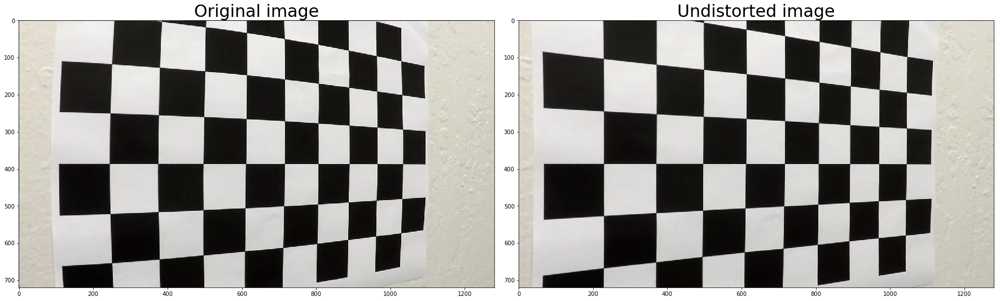

In [6]:
# Show an example of an undistorted image
img = mpimg.imread("camera_cal/calibration5.jpg")
undist = cv2.undistort(img, mtx, dist, None, mtx)
out_img_path = os.path.join("output_images", "calibration_5_calibrated.jpg")
mpimg.imsave(out_img_path, undist)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

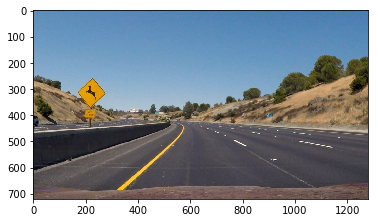

In [7]:
# Read an example test image
# This image will be used for testing different methods in the processing pipeline
test_img = 'test_images/test2.jpg'
img = mpimg.imread(test_img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  
img_size = gray.shape[::-1]
plt.imshow(img)

In [8]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, mag_thresh=(0, 255)):
    """
    Calculate the Sobel gradient on the image, either in x or y direction
    """
    thresh_min = mag_thresh[0]
    thresh_max = mag_thresh[1]
    
    # Convert to gray
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Calculate Sobel
    sob = None
    if orient == 'x':
        sob = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    elif orient == 'y':
        sob = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    
    # Construct the scaled Sobel image and the binary
    abs_sob = np.absolute(sob)
    scaled_sobel = np.uint8(255*abs_sob/np.max(abs_sob))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    return sxbinary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    """
    Calculate the magnitude of the Sobel function on the image, 
    taking into account both x and y gradients
    """
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Calculate x and y gradients, and get the magnitude by
    # taking both x an dy directions into account
    sobx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    soby = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    abs_sob_xy = np.sqrt(np.square(sobx) + np.square(soby))
    
    # Construct the scaled Sobel image and the binary
    scaled_sobel = np.uint8(255*abs_sob_xy/np.max(abs_sob_xy))
    sxbinary = np.zeros_like(scaled_sobel)
    thresh_min = mag_thresh[0]
    thresh_max = mag_thresh[1]
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    return sxbinary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    '''
    Calculate the direction of the gradient using Sobel derivatives
    The function calculates arctan(sobely/sobelx)
    '''
    
    # Convert to grayscale and calculate x and y gradients
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    soby = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    
    # Calculate the gradient direction
    grad_dir = np.arctan2(np.absolute(soby),np.absolute(sobx))
    
    # Construct the scaled Sobel image and the binary
    binary = np.zeros_like(grad_dir)
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    binary[(grad_dir >= thresh_min) & (grad_dir <= thresh_max)] = 1
    
    return binary

def mag_dir_threshold(img, ksize=3, magn_thresh=(20, 255), dir_thresh=(0.7, 1/3)):
    '''
    Calculate both magnitude and direction of the gradient, and return the binary image
    where both magnitude and direction are taken into account
    '''
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, mag_thresh=magn_thresh)
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, mag_thresh=magn_thresh)
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=magn_thresh)
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=dir_thresh)
    
    # Get the combined result
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1  
    
    # Another possible option:
    # combined[(gradx == 1) & (dir_binary == 1)] = 1
    
    return combined


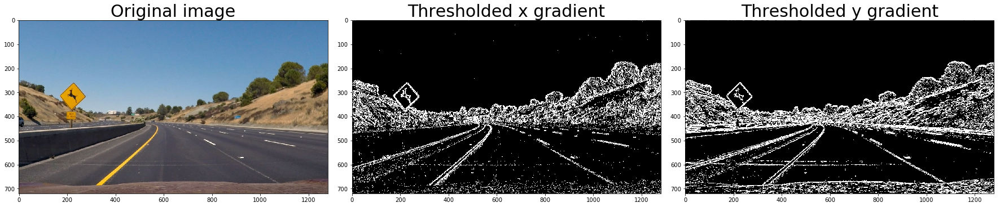

In [9]:
# Calculate x and y gradients separately
gradx_binary = abs_sobel_thresh(img, orient='x', sobel_kernel=3, mag_thresh=(10, 255))
grady_binary = abs_sobel_thresh(img, orient='y', sobel_kernel=3, mag_thresh=(10, 255))
# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original image', fontsize=30)
ax2.imshow(gradx_binary, cmap='gray')
ax2.set_title('Thresholded x gradient', fontsize=30)
ax3.imshow(grady_binary, cmap='gray')
ax3.set_title('Thresholded y gradient', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
gradx_img_path = os.path.join("output_images", "test_gradx.jpg")
mpimg.imsave(gradx_img_path, gradx_binary, cmap='gray')
grady_img_path = os.path.join("output_images", "test_grady.jpg")
mpimg.imsave(grady_img_path, grady_binary, cmap='gray')

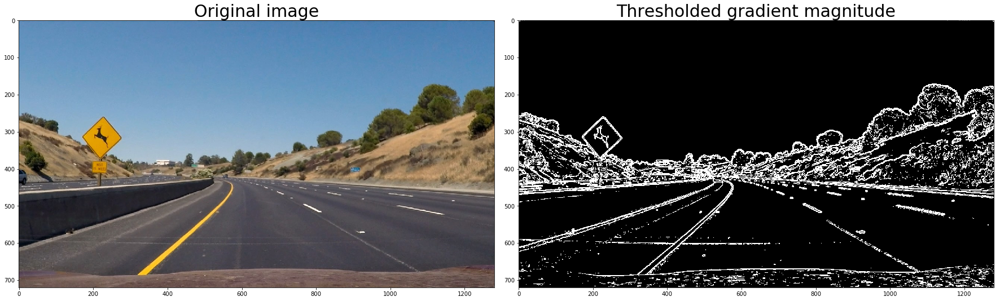

In [10]:
# Calculate the magnitude of the gradient, both x and y are taken into account
mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(20, 255))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original image', fontsize=30)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded gradient magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
grad_mag_img_path = os.path.join("output_images", "test_grad_mag.jpg")
mpimg.imsave(grad_mag_img_path, mag_binary, cmap='gray')

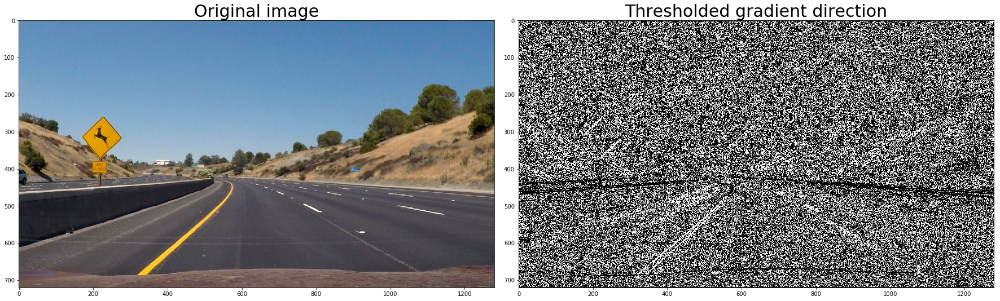

In [11]:
# Calculate the direction of the gradient
dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original image', fontsize=30)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded gradient direction', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
grad_dir_img_path = os.path.join("output_images", "test_grad_dir.jpg")
mpimg.imsave(grad_dir_img_path, dir_binary, cmap='gray')

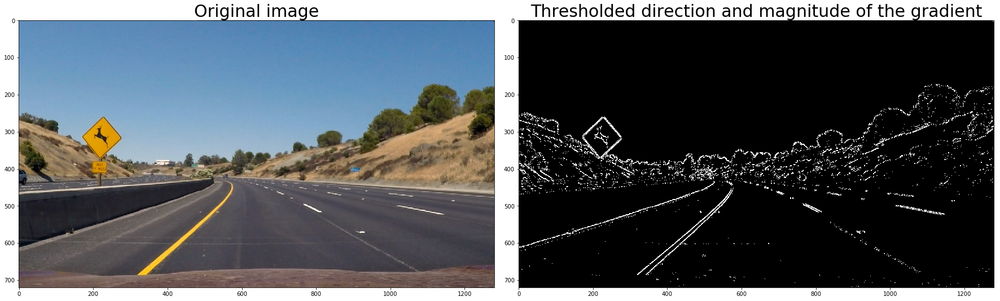

In [12]:
# Get the combined gradient magnitude and direction
combined = mag_dir_threshold(img)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original image', fontsize=30)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Thresholded direction and magnitude of the gradient', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
grad_magdir_img_path = os.path.join("output_images", "test_grad_mag_dir.jpg")
mpimg.imsave(grad_magdir_img_path, combined, cmap='gray')

In [13]:
def get_rgb_binary(image, mag_thresh_r=(30, 130), mag_thresh_g=(30, 130), mag_thresh_b=(30, 130)):
    '''
    Returns thresholded R, G, B components of the image
    '''
    R = image[:,:,2]    
    G = image[:,:,1]    
    B = image[:,:,0]
    R_b = np.zeros_like(R)
    R_b[(R>mag_thresh_r[0]) & (R<mag_thresh_r[1])] = 1
    G_b = np.zeros_like(R)
    G_b[(G>mag_thresh_g[0]) & (G<mag_thresh_g[1])] = 1
    B_b = np.zeros_like(R)
    B_b[(B>mag_thresh_b[0]) & (B<mag_thresh_b[1])] = 1

    return (R_b, G_b, B_b)

def get_rgb(image):
    '''
    Returns R, G, B components of the image
    '''
    R = image[:,:,2]    
    G = image[:,:,1]    
    B = image[:,:,0]
    
    zero_channel = np.zeros_like(R) # create a zero color channel
    R = np.array(cv2.merge((R,zero_channel,zero_channel)),np.uint8)
    G = np.array(cv2.merge((zero_channel,G,zero_channel)),np.uint8)
    B = np.array(cv2.merge((zero_channel,zero_channel,B)),np.uint8)
                

    return (R, G, B)

def get_hls(image):
    '''
    Returns thresholded H, L, S components of the image
    '''
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    zero_channel = np.zeros_like(H) # create a zero color channel
    H = np.array(cv2.merge((H,zero_channel,zero_channel)),np.uint8)
    L = np.array(cv2.merge((zero_channel,L,zero_channel)),np.uint8)
    S = np.array(cv2.merge((zero_channel,zero_channel,S)),np.uint8)
    
    return (H, L, S)

def get_hls_binary(image, mag_thresh_h=(30, 130), mag_thresh_l=(30, 130), mag_thresh_s=(30, 130)):
    '''
    Returns H, L, S components of the image
    '''
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    H_b = np.zeros_like(H)
    H_b[(H>mag_thresh_h[0]) & (H<mag_thresh_h[1])] = 1
    L_b = np.zeros_like(L)
    L_b[(L>mag_thresh_l[0]) & (L<mag_thresh_l[1])] = 1
    S_b = np.zeros_like(S)
    S_b[(S>mag_thresh_s[0]) & (S<mag_thresh_s[1])] = 1
    
    return (H_b, L_b, S_b)

def get_gray_binary(image, thresh=(100, 200)):
    '''
    Returns thresholded grayscale image
    '''
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    binary = np.zeros_like(gray)
    binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    
    return gray, binary

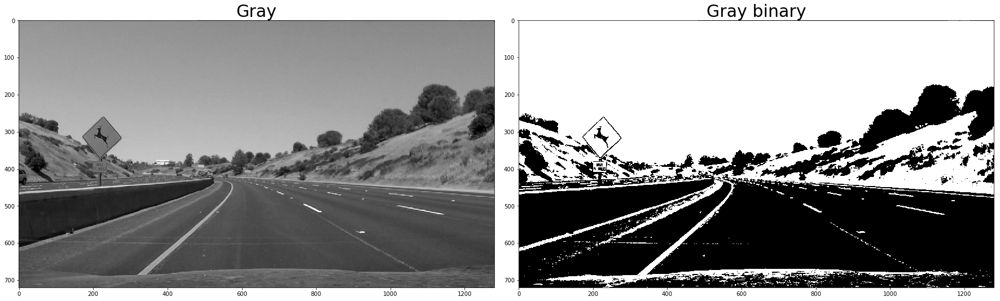

In [14]:
# Calculate the gray binary image
gray, gray_binary = get_gray_binary(img, thresh=(100,255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(gray, cmap='gray')
ax1.set_title('Gray', fontsize=30)
ax2.imshow(gray_binary, cmap='gray')
ax2.set_title('Gray binary', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
gray_binary_img_path = os.path.join("output_images", "test_gray_binary.jpg")
mpimg.imsave(gray_binary_img_path, gray_binary, cmap='gray')

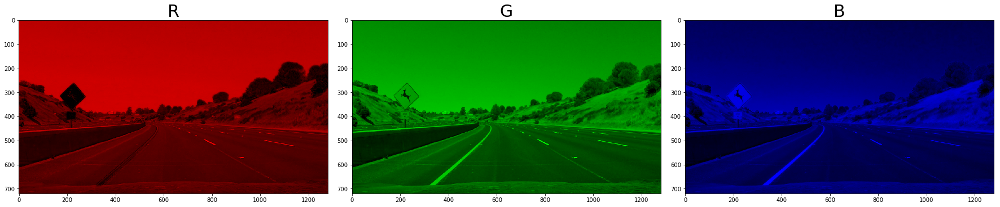

In [15]:
# Display R, G, B components
R, G, B = get_rgb(img)
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(R)
ax1.set_title('R', fontsize=30)
ax2.imshow(G)
ax2.set_title('G', fontsize=30)
ax3.imshow(B)
ax3.set_title('B', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
r_img_path = os.path.join("output_images", "test_r.jpg")
mpimg.imsave(r_img_path, R)
g_img_path = os.path.join("output_images", "test_g.jpg")
mpimg.imsave(g_img_path, G)
b_img_path = os.path.join("output_images", "test_b.jpg")
mpimg.imsave(b_img_path, B)

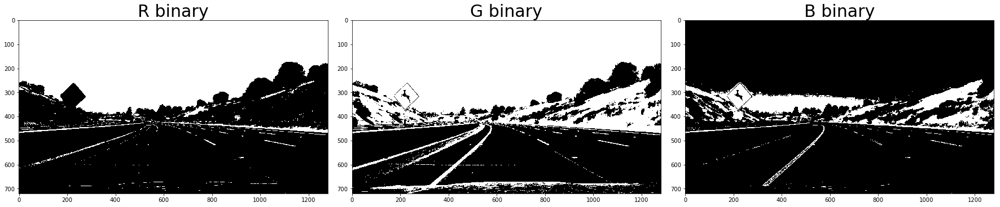

In [16]:
# Calculate binaries of R, G, B components
R_b, G_b, B_b = get_rgb_binary(img, mag_thresh_r=(120,256), mag_thresh_g=(100,255), mag_thresh_b=(150,255))
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(R_b, cmap='gray')
ax1.set_title('R binary', fontsize=30)
ax2.imshow(G_b, cmap='gray')
ax2.set_title('G binary', fontsize=30)
ax3.imshow(B_b, cmap='gray')
ax3.set_title('B binary', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
r_binary_img_path = os.path.join("output_images", "test_r_binary.jpg")
mpimg.imsave(r_binary_img_path, R_b, cmap='gray')
g_binary_img_path = os.path.join("output_images", "test_g_binary.jpg")
mpimg.imsave(g_binary_img_path, G_b, cmap='gray')
b_binary_img_path = os.path.join("output_images", "test_b_binary.jpg")
mpimg.imsave(b_binary_img_path, B_b, cmap='gray')

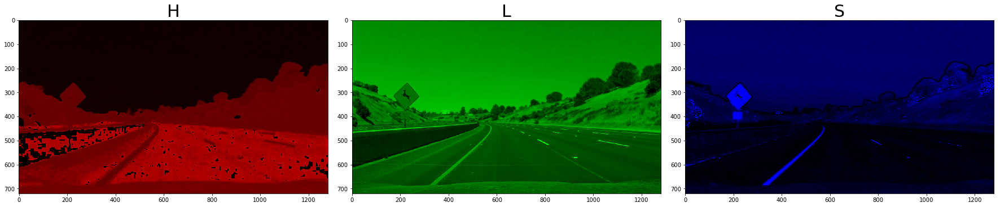

In [17]:
# Display H, L, S components
H, L, S = get_hls(img)
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H)
ax1.set_title('H', fontsize=30)
ax2.imshow(L)
ax2.set_title('L', fontsize=30)
ax3.imshow(S)
ax3.set_title('S', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
h_img_path = os.path.join("output_images", "test_h.jpg")
mpimg.imsave(h_img_path, H, cmap='gray')
l_img_path = os.path.join("output_images", "test_l.jpg")
mpimg.imsave(l_img_path, L, cmap='gray')
s_img_path = os.path.join("output_images", "test_s.jpg")
mpimg.imsave(s_img_path, S, cmap='gray')

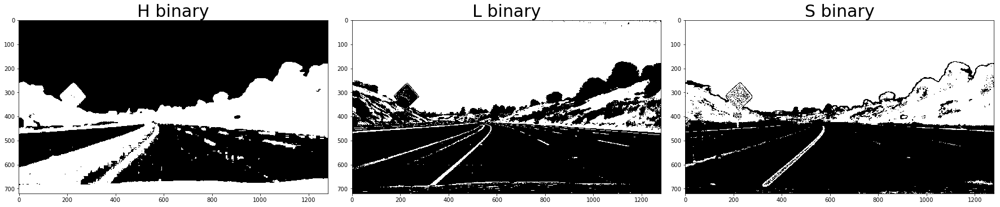

In [18]:
# Display binary H, L, S components
H_b, L_b, S_b = get_hls_binary(img, mag_thresh_h=(40,150), mag_thresh_l=(120, 255), mag_thresh_s=(50,255))
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H_b, cmap='gray')
ax1.set_title('H binary', fontsize=30)
ax2.imshow(L_b, cmap='gray')
ax2.set_title('L binary', fontsize=30)
ax3.imshow(S_b, cmap='gray')
ax3.set_title('S binary', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
h_binary_img_path = os.path.join("output_images", "test_h_binary.jpg")
mpimg.imsave(h_binary_img_path, H_b, cmap='gray')
l_binary_img_path = os.path.join("output_images", "test_l_binary.jpg")
mpimg.imsave(l_binary_img_path, L_b, cmap='gray')
s_binary_img_path = os.path.join("output_images", "test_s_binary.jpg")
mpimg.imsave(s_binary_img_path, S_b, cmap='gray')

In [19]:
def pipeline(img, s_thresh=(180, 255), sd_thresh=(0.7, 1.3), sx_thresh=(10, 130)):
    '''
    Pipeline to get the lane pixels by using L and S channel
    '''
    
    # img = np.copy(img)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    # Sobel x on the S channel
    sobel_s_x = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0, 9) # Take the derivative in x
    abs_sobel_s_x = np.absolute(sobel_s_x) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel_s_x = np.uint8(255*abs_sobel_s_x/np.max(abs_sobel_s_x))
    sxbinary = np.zeros_like(scaled_sobel_s_x)
    sxbinary[(scaled_sobel_s_x >= sx_thresh[0]) & (scaled_sobel_s_x <= sx_thresh[1])] = 1
    
    # Sobel x on the L channel
    sobel_l_x = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, 9) # Take the derivative in x
    abs_sobel_l_x = np.absolute(sobel_l_x) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel_l_x = np.uint8(255*abs_sobel_l_x/np.max(abs_sobel_l_x))
    lxbinary = np.zeros_like(scaled_sobel_l_x)
    lxbinary[(scaled_sobel_l_x >= sx_thresh[0]) & (scaled_sobel_l_x <= sx_thresh[1])] = 1
    
    # Calculate the gradient direction on the L channel
    sobx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0)
    soby = cv2.Sobel(s_channel, cv2.CV_64F, 0, 1)
    grad_dir = np.arctan2(np.absolute(soby),np.absolute(sobx))
    # abs_sob_xy = np.sqrt(np.square(sobx) + np.square(soby))
    # scaled_sobel = np.uint8(255*abs_sob_xy/np.max(abs_sob_xy))
    sdbinary = np.zeros_like(grad_dir)
    sdbinary[(grad_dir >= sd_thresh[0]) & (grad_dir <= sd_thresh[1])] = 1
    
    # Combine x gradient on S channel and direction gradient on L channel
    combined = np.zeros_like(dir_binary)
    combined[((sxbinary == 1) | (lxbinary == 1)) & (sdbinary == 1)] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(l_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) #  * 255
    color_binary = np.dstack(( np.zeros_like(combined), combined, s_binary)) #  * 255
    
    # Create the final result
    final = np.zeros_like(s_channel)
    final[(combined == 1) | (s_binary == 1)] = 1
    return combined

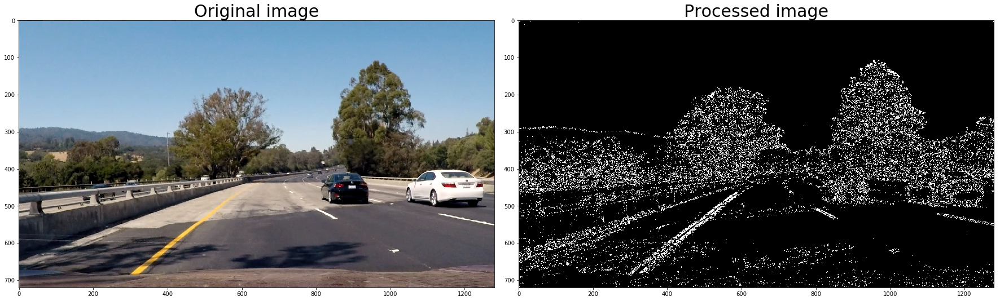

In [20]:
# Test on image test4.jpg
test_img = 'test_images/test4.jpg'
img = mpimg.imread(test_img)
result = pipeline(img)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original image', fontsize=30)
ax2.imshow(result, cmap='gray')
ax2.set_title('Processed image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
processed_img_path = os.path.join("output_images", "test_4_processed.jpg")
mpimg.imsave(processed_img_path, result, cmap='gray')

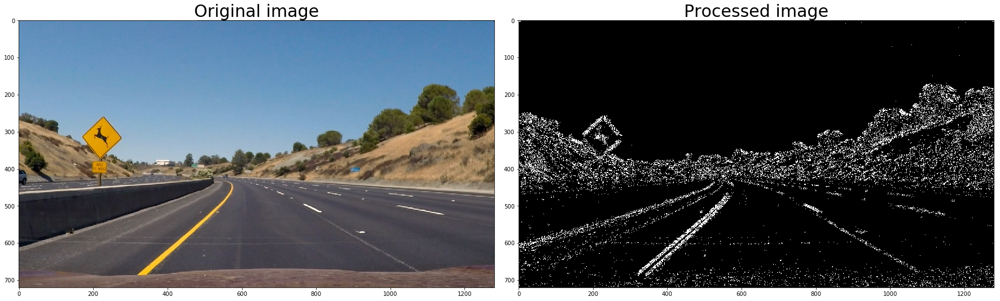

In [21]:
# Test on image test2.jpg
test_img = 'test_images/test2.jpg'
img = mpimg.imread(test_img)
result = pipeline(img)
'''
kernel = np.ones((3,3), np.uint8)
img_erosion = cv2.erode(result, kernel, iterations=1)
kernel = np.ones((5,5), np.uint8)
result2= cv2.dilate(img_erosion, kernel, iterations=1)
'''
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original image', fontsize=30)
ax2.imshow(result, cmap='gray')
ax2.set_title('Processed image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
processed_img_path = os.path.join("output_images", "test_2_processed.jpg")
mpimg.imsave(processed_img_path, result, cmap='gray')

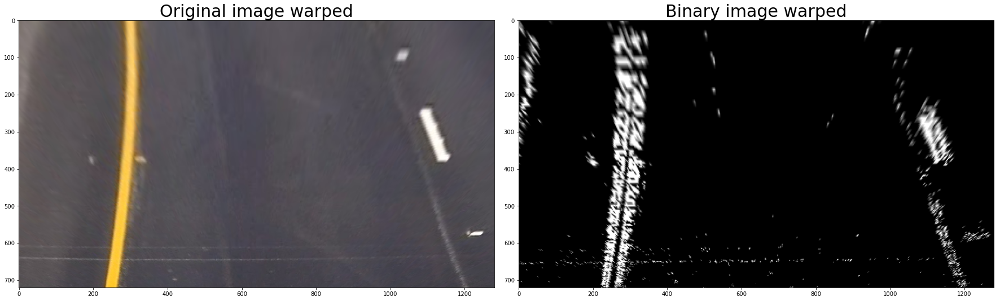

In [22]:
# Undistort and warp the image
test_img = 'test_images/test2.jpg'
img = mpimg.imread(test_img)
result = pipeline(img)
undist = cv2.undistort(result, mtx, dist, None, mtx)
# Specify the points to calculate the transform matrices
img_size = (undist.shape[1], undist.shape[0])
offset = 0
# src = np.float32([[500,470], [780,470], [1080,650], [200,650]])
src = np.float32([[500,470], [780,470], [1080,650], [200,650]])
# src = np.float32([[600,450], [750,450], [1200,700], [220,700]])
dst = np.float32([[offset, offset], [img_size[0]-offset, offset], [img_size[0]-offset, img_size[1]-offset], [offset, img_size[1]-offset]])

# Get both transform and inverse-transform matrices
M = cv2.getPerspectiveTransform(src,dst)
M_inv = cv2.getPerspectiveTransform(dst,src)
# Warp the images
binary_warped = cv2.warpPerspective(undist, M, (1280, 720), flags=cv2.INTER_LINEAR)
orig_warped = cv2.warpPerspective(img, M, (1280, 720), flags=cv2.INTER_LINEAR)
# Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(orig_warped)
ax1.set_title('Original image warped', fontsize=30)
ax2.imshow(binary_warped, cmap='gray')
ax2.set_title('Binary image warped', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
ow_img_path = os.path.join("output_images", "test_orig_warped.jpg")
mpimg.imsave(ow_img_path, orig_warped)
bw_img_path = os.path.join("output_images", "test_binary_warped.jpg")
mpimg.imsave(bw_img_path, binary_warped, cmap='gray')

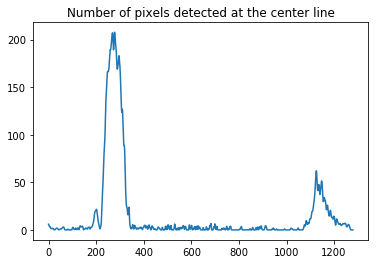

In [23]:
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
plt.plot(histogram)
hist_img_path = os.path.join("output_images", "test_hist.jpg")
plt.title('Number of pixels detected at the center line')
plt.savefig(hist_img_path)

In [24]:
def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    a = int(img_ref.shape[0]-(level+1)*height)
    b = int(img_ref.shape[0]-level*height)
    c = max(0,int(center-width/2))
    d = min(int(center+width/2),img_ref.shape[1])
    output[a:b,c:d] = 1
    return output

def pt_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    a = int(img_ref.shape[0]-(level+1)*height)
    b = int(img_ref.shape[0]-level*height)
    c = max(0,int(center-width/2))
    d = min(int(center+width/2),img_ref.shape[1])
    output[a:b,c:d] = img_ref[a:b,c:d]
    return output.sum()

def my(image, window_width, window_height, margin):
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    a = int(3*image.shape[0]/6)
    b = int(image.shape[1]/2)
    
    ii = image[a:,:b]
    l_sum = np.sum(image[a:,:b], axis=0)
    
    convl = np.convolve(window,l_sum)
    l_center = np.argmax(convl)-window_width/2
    c = int(3*image.shape[0]/6)
    d = int(image.shape[1]/2)
    r_sum = np.sum(image[c:,d:], axis=0)
    convr = np.convolve(window,r_sum)
    r_center = np.argmax(convr)-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    # window_centroids.append((l_center,r_center))
    # print(window_centroids)
    # return window_centroids
    # Go through each layer looking for max pixel locations
    for level in range((int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        a = int(image.shape[0]-(level+1)*window_height)
        b = int(image.shape[0]-level*window_height)
        m = int(image.shape[1] / 2)
        n = m
        # print(a, b, m, n)
        image_layer_l = np.sum(image[a:b,:m], axis=0)
        image_layer_r = np.sum(image[a:b,n:], axis=0)
        conv_signal_l = np.convolve(window, image_layer_l)
        conv_signal_r = np.convolve(window, image_layer_r)
        # print(image_layer)
        '''
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        '''
        l_center = np.argmax(conv_signal_l)
        '''
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        '''
        r_center = m + np.argmax(conv_signal_r)
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))
        
    return window_centroids

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    a = int(3*image.shape[0]/4)
    b = int(image.shape[1]/2)
    
    ii = image[a:,:b]
    l_sum = np.sum(image[a:,:b], axis=0)
    
    convl = np.convolve(window,l_sum)
    l_center = np.argmax(convl)-window_width/2
    c = int(3*image.shape[0]/4)
    d = int(image.shape[1]/2)
    r_sum = np.sum(image[c:,d:], axis=0)
    convr = np.convolve(window,r_sum)
    r_center = np.argmax(convr)-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    # print(window_centroids)
    # return window_centroids
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        a = int(image.shape[0]-(level+1)*window_height)
        b = int(image.shape[0]-level*window_height)
        image_layer = np.sum(image[a:b,:], axis=0)
        print (a, b, image_layer)
        conv_signal = np.convolve(window, image_layer)
        print(conv_signal)
        # print(image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def get_lane_points_and_windows(warped):

    # window settings
    window_width = 30 
    window_height = 40 # Break image into 9 vertical layers since image height is 720
    margin = 100 # How much to slide left and right for searching
    mid = int(warped.shape[1] / 2)
    window_centroids = my(warped, window_width, window_height, margin)
    # window_centroids = find_window_centroids(warped, window_width, window_height, margin)
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            lsum = pt_mask(window_width,window_height,warped,window_centroids[level][0],level)
            rsum = pt_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            
            if window_centroids[level][0] < 0.67 * mid and lsum > 50:
                l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            if window_centroids[level][1] > 1.33  * mid and rsum > 50:
                r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
            
            '''
            if lsum > 20:
                l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            if rsum > 20:
                r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
            '''
            # l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            # r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
            # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.uint8(np.dstack((warped, warped, warped))*255) # making the original road pixels 3 color channels
        output_img = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output_img = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    return output_img, l_points, r_points

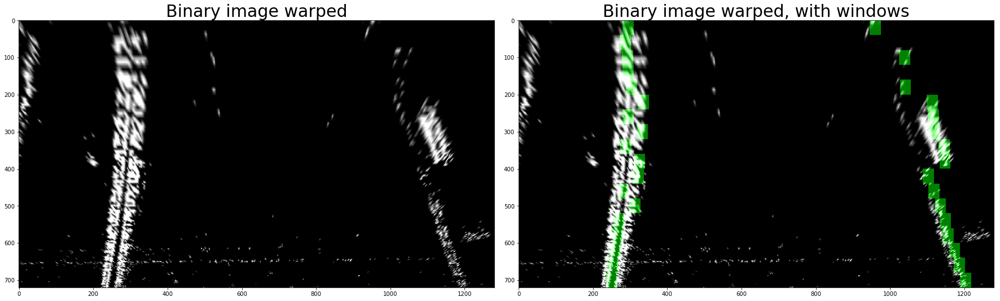

In [25]:
# Test the function to generate windows over lane lines
binary_warped = cv2.warpPerspective(undist, M, (1280, 720), flags=cv2.INTER_LINEAR)
output_img, l_points, r_points = get_lane_points_and_windows(binary_warped)
# Plot outputs
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(binary_warped, cmap='gray')
ax1.set_title('Binary image warped', fontsize=30)
ax2.imshow(output_img)
ax2.set_title('Binary image warped, with windows', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
bww_img_path = os.path.join("output_images", "test_binary_warped_win.jpg")
mpimg.imsave(bww_img_path, output_img)

In [34]:
from collections import deque
left_fit_past  = deque([])
right_fit_past = deque([])
deq_size = 10
def calc_avg_fit(fit_past):
    fit_0, fit_1, fit_2 = 0, 0, 0
    count = len(fit_past)
    for i in range(count):
        fit_0 += fit_past[i][0]
        fit_1 += fit_past[i][1]
        fit_2 += fit_past[i][2]
    return fit_0/count, fit_1/count, fit_2/count

def fit_poly_past(orig_warped, binary_warped, l_points, r_points):
    '''
    Fit the polynomials through the lane line points, and return the 
    zone between the lane lines
    '''
    leftx = l_points.nonzero()[1]
    lefty = l_points.nonzero()[0]
    rightx = r_points.nonzero()[1]
    righty = r_points.nonzero()[0]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    print("This iteration left fit:", left_fit)
    print("This iteration right fit:", right_fit)
    
    left_fit_past.append(left_fit)
    right_fit_past.append(right_fit)
    if len(left_fit_past) > deq_size:
        _ = left_fit_past.popleft()
    if len(right_fit_past) > deq_size:
        _ = right_fit_past.popleft()
    left_fit_0, left_fit_1, left_fit_2 = calc_avg_fit(left_fit_past)
    right_fit_0, right_fit_1, right_fit_2 = calc_avg_fit(right_fit_past)
    
    print("This iteration used left fit:", left_fit_0, left_fit_1, left_fit_2, len(left_fit_past))
    print("This iteration used right fit:", right_fit_0, right_fit_1, right_fit_2, len(right_fit_past))
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit_0*ploty**2 + left_fit_1*ploty + left_fit_2
    right_fitx = right_fit_0*ploty**2 + right_fit_1*ploty + right_fit_2
    yvals = np.linspace(0, img.shape[0], num=img.shape[0])
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))

    # Create the image
    zone = np.zeros_like(orig_warped)
    cv2.fillPoly(zone, np.int_([pts]), (0,255, 0))
    cv2.polylines(zone, np.array([pts_left], dtype=np.int32), False,(255,0,0),thickness = 15)
    cv2.polylines(zone, np.array([pts_right], dtype=np.int32), False,(0,0,255),thickness = 15)

    return zone

def fit_poly(orig_warped, binary_warped, l_points, r_points):
    '''
    Fit the polynomials through the lane line points, and return the 
    zone between the lane lines
    '''
    leftx = l_points.nonzero()[1]
    lefty = l_points.nonzero()[0]
    rightx = r_points.nonzero()[1]
    righty = r_points.nonzero()[0]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    yvals = np.linspace(0, img.shape[0], num=img.shape[0])
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))

    # Create the image
    zone = np.zeros_like(orig_warped)
    cv2.fillPoly(zone, np.int_([pts]), (0,255, 0))
    cv2.polylines(zone, np.array([pts_left], dtype=np.int32), False,(255,0,0),thickness = 15)
    cv2.polylines(zone, np.array([pts_right], dtype=np.int32), False,(0,0,255),thickness = 15)

    return zone

def get_poly_fit(l_points, r_points):
    '''
    Fit the polynomials through the lane line points, and return the 
    zone between the lane lines
    '''
    leftx = l_points.nonzero()[1]
    lefty = l_points.nonzero()[0]
    rightx = r_points.nonzero()[1]
    righty = r_points.nonzero()[0]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return left_fit, right_fit

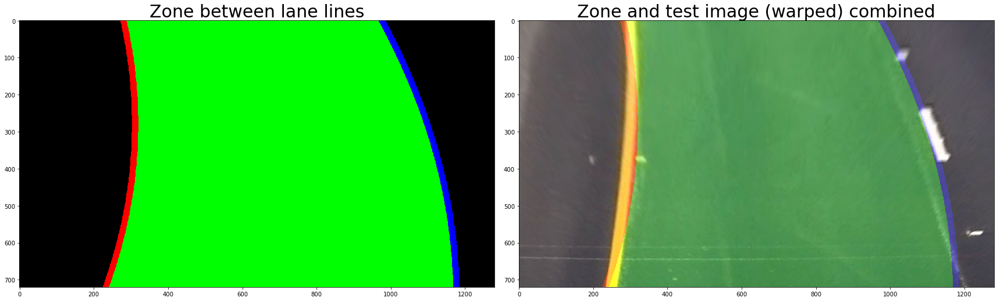

In [35]:
# Test the function that generates the zone
binary_warped = cv2.warpPerspective(undist, M, (1280, 720), flags=cv2.INTER_LINEAR)
orig_warped = cv2.warpPerspective(img, M, (1280, 720), flags=cv2.INTER_LINEAR)
zone = fit_poly(orig_warped, binary_warped, l_points.astype(int), r_points.astype(int))
combined = cv2.addWeighted(orig_warped, 1, zone, 0.3, 0)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(zone)
ax1.set_title('Zone between lane lines', fontsize=30)
ax2.imshow(combined)
ax2.set_title('Zone and test image (warped) combined', fontsize=30)
zone_img_path = os.path.join("output_images", "test_zone.jpg")
mpimg.imsave(zone_img_path, zone)
zone_combined_img_path = os.path.join("output_images", "test_zone_combined.jpg")
mpimg.imsave(zone_combined_img_path, combined)

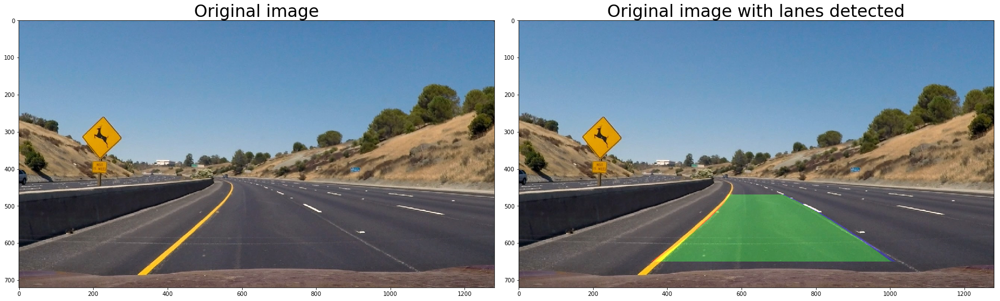

In [36]:
# Transform the image back to the original perspective by using the inverse tranform matrix
zone_warped = cv2.warpPerspective(zone, M_inv, (1280, 720), flags=cv2.INTER_LINEAR)
result = cv2.addWeighted(img, 1, zone_warped, 0.3, 0)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original image', fontsize=30)
ax2.imshow(result)
ax2.set_title('Original image with lanes detected', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
orig_detected_img_path = os.path.join("output_images", "test_orig_detected.jpg")
mpimg.imsave(orig_detected_img_path, result)

This iteration left fit: [ -4.05612496e-04   2.26254600e-01   2.80660913e+02]
This iteration right fit: [ -3.59154311e-04   5.36502450e-01   9.76967970e+02]
This iteration used left fit: -0.000405612495701 0.226254599852 280.660913269 1
This iteration used right fit: -0.000359154311369 0.536502449609 976.967970019 1


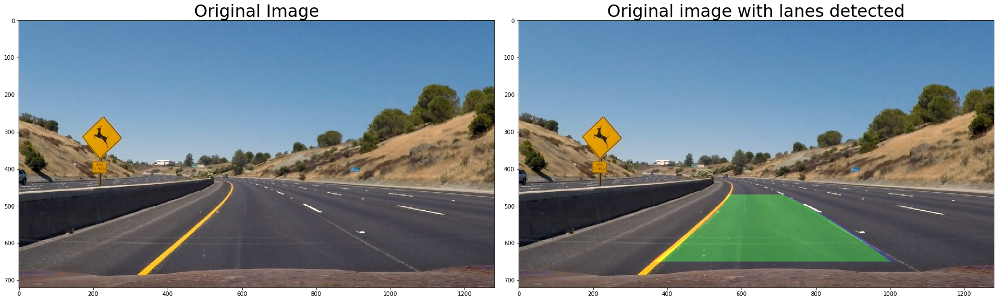

In [37]:
# Here we create the final pipeline for image processing, based on the work above

def pipeline_final(img): 
    # Use the previously defined pipeline method for getting a binary image
    result = pipeline(img)
    # Undistort
    undist = cv2.undistort(result, mtx, dist, None, mtx)
    # Create warped images: binary and original 
    binary_warped = cv2.warpPerspective(undist, M, (1280, 720), flags=cv2.INTER_LINEAR)
    orig_warped = cv2.warpPerspective(img, M, (1280, 720), flags=cv2.INTER_LINEAR)
    # Get the points for fitting the polynomial
    _, l_points, r_points = get_lane_points_and_windows(binary_warped)
    # Get the zone image
    # For single frames, use fit_poly, not fit_poly_past
    # zone_img = fit_poly(orig_warped, binary_warped, l_points.astype(int), r_points.astype(int))
    zone_img = fit_poly_past(orig_warped, binary_warped, l_points.astype(int), r_points.astype(int))
    zone_warped = cv2.warpPerspective(zone_img, M_inv, (1280, 720), flags=cv2.INTER_LINEAR)
    result = cv2.addWeighted(img, 1, zone_warped, 0.3, 0)
    return result

def pipeline_final_2(img): 
    orig_warped = cv2.warpPerspective(img, M, (1280, 720), flags=cv2.INTER_LINEAR)
    # Use the previously defined pipeline method for getting a binary image
    result = pipeline(orig_warped)
    
    # Undistort
    undist = cv2.undistort(result, mtx, dist, None, mtx)
    
    # Create warped images: binary and original 
    # binary_warped = cv2.warpPerspective(undist, M, (1280, 720), flags=cv2.INTER_LINEAR)
    # return binary_warped
    # Get the points for fitting the polynomial
    w, l_points, r_points = get_lane_points_and_windows(undist)
    return w
    # Get the zone image
    # For single frames, use fit_poly, not fit_poly_past
    # zone_img = fit_poly(orig_warped, binary_warped, l_points.astype(int), r_points.astype(int))
    zone_img = fit_poly_past(orig_warped, undist, l_points.astype(int), r_points.astype(int))
    zone_warped = cv2.warpPerspective(zone_img, M_inv, (1280, 720), flags=cv2.INTER_LINEAR)
    result = cv2.addWeighted(img, 1, zone_warped, 0.3, 0)
    return w

# Test the pipeline
test_img = mpimg.imread('test_images/test2.jpg')
result = pipeline_final(test_img) # , mtx, dist, M, M_inv)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result)
ax2.set_title('Original image with lanes detected', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Curvature in meters: 401.023967916 m 416.014466578 m


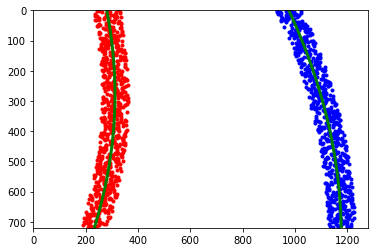

In [38]:
# Here, we want to calculate the radius of the curature
# We will use the params of the polynomial which is drawn on the image above
def get_curvature(l_points, r_points, do_plot=False):
    '''
    Calculate curvature of the lanes, at the position closest to the vehicle
    '''
    
    # Calculate the polynomials 
    left_fit, right_fit = get_poly_fit(l_points, r_points)
    
    # Generate y data
    ploty = np.linspace(0, 719, num=720) 
    
    leftx = np.array([left_fit[2] + (y**2)*left_fit[0] + y * left_fit[1] + np.random.randint(-50, high=51) for y in ploty])
    rightx = np.array([right_fit[2] + (y**2)*right_fit[0] + y * right_fit[1] + np.random.randint(-50, high=51) for y in ploty])

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    if do_plot == True:

        # Plot up the fake data
        mark_size = 3
        plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
        plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
        plt.xlim(0, 1280)
        plt.ylim(0, 720)
        plt.plot(left_fitx, ploty, color='green', linewidth=3)
        plt.plot(right_fitx, ploty, color='green', linewidth=3)
        plt.gca().invert_yaxis() # to visualize as we do the images
        
    # Define y-value where we want radius of curvature
    # Use bottom of the image, where the vehicle is
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Now our radius of curvature is in meters
    
    return left_curverad, right_curverad
    
left_curverad, right_curverad = get_curvature(l_points, r_points, True)
print("Curvature in meters:", left_curverad, 'm', right_curverad, 'm')

In [30]:
# This cell dumps the project input video to a directory, frame by frame
# Only need to run this once per project
'''
count_images = 1200
def video_to_frames(video, path_output_dir):
    # extract frames from a video and save to directory as 'x.png' where 
    # x is the frame index
    vidcap = cv2.VideoCapture(video)
    count = 1
    while vidcap.isOpened():
        success, image = vidcap.read()
        if success:
            cv2.imwrite(os.path.join(path_output_dir, '%d.jpg') % count, image)
        else:
            break
        if count == count_images:
            break
        count += 1
    cv2.destroyAllWindows()
    vidcap.release()

video_to_frames("project_video.mp4", "frames")
print("Done storing images")
'''

'\ncount_images = 1200\ndef video_to_frames(video, path_output_dir):\n    # extract frames from a video and save to directory as \'x.png\' where \n    # x is the frame index\n    vidcap = cv2.VideoCapture(video)\n    count = 1\n    while vidcap.isOpened():\n        success, image = vidcap.read()\n        if success:\n            cv2.imwrite(os.path.join(path_output_dir, \'%d.jpg\') % count, image)\n        else:\n            break\n        if count == count_images:\n            break\n        count += 1\n    cv2.destroyAllWindows()\n    vidcap.release()\n\nvideo_to_frames("project_video.mp4", "frames")\nprint("Done storing images")\n'

In [31]:
from collections import deque
import shutil

# Uncomment for batch analysis of different history sizes
# sizes = [1, 2, 4, 6, 8, 10]
sizes = [9]

def create_clean_dir(out_name):
    if os.path.exists(out_name):
        print("Removing the existing directory:", out_name)
        shutil.rmtree(out_name)
    os.makedirs(out_name)
    
for sz in sizes:
    out_dir = 'pf_' + str(sz)
    create_clean_dir(out_dir) 

    left_fit_past  = deque([])
    right_fit_past = deque([])
    deq_size = sz

    count_images = len(os.listdir("frames"))

    # Uncomment to create a shorter video
    # count_images = 20
    isorted = []
    step_perc = 5
    next_perc = step_perc
    for i in range(1, count_images):
        curr_perc = 100 * i / count_images
        if curr_perc >= next_perc:
            print("At " + str(curr_perc) + "%")
            next_perc += step_perc
        file_name = str(i) + ".jpg"
        in_file = os.path.join("frames", file_name)
        out_file = os.path.join(out_dir, file_name)
        print(out_file)
        iimg = mpimg.imread(in_file)
        iresult = pipeline_final(iimg)
        mpimg.imsave(out_file, iresult)
        isorted.append(out_file)
print("Done storing images")

pf_9\1.jpg
This iteration left fit: [ -2.95149674e-04   1.10334847e-01   2.99341393e+02]
This iteration right fit: [ -1.35865443e-04   4.59808849e-01   1.01204839e+03]
This iteration used left fit: -0.000295149673944 0.110334847026 299.341392572 1
This iteration used right fit: -0.000135865442585 0.459808848556 1012.04838928 1
pf_9\2.jpg
This iteration left fit: [ -2.47360512e-04   9.60876472e-02   2.94000268e+02]
This iteration right fit: [ -3.48162259e-06   3.75280127e-01   1.01200496e+03]
This iteration used left fit: -0.000271255093025 0.103211247106 296.670830116 2
This iteration used right fit: -6.96735325879e-05 0.417544487666 1012.02667639 2
pf_9\3.jpg
This iteration left fit: [ -1.94530467e-04   4.31851204e-02   3.02464260e+02]
This iteration right fit: [ -7.42207417e-05   4.50287189e-01   9.96175286e+02]
This iteration used left fit: -0.000245680217656 0.0832025382198 298.601973337 3
This iteration used right fit: -7.11892689467e-05 0.428458721279 1006.74287961 3
pf_9\4.jpg
T

pf_9\26.jpg
This iteration left fit: [ -8.45042571e-05  -3.67057577e-03   2.78002611e+02]
This iteration right fit: [ -2.54053919e-04   5.63144145e-01   9.67080491e+02]
This iteration used left fit: -8.23520689372e-05 0.0100712393907 276.753033438 9
This iteration used right fit: -9.75158510766e-05 0.460040423245 972.130041447 9
pf_9\27.jpg
This iteration left fit: [ -1.23442104e-04   1.65325113e-02   2.76620717e+02]
This iteration right fit: [  2.86457032e-05   3.82535344e-01   9.83512975e+02]
This iteration used left fit: -8.91658613919e-05 0.0138986805731 274.681669469 9
This iteration used right fit: -8.75188768888e-05 0.448868712472 975.959304299 9
pf_9\28.jpg
This iteration left fit: [ -7.60101702e-05   1.46049388e-02   2.63078953e+02]
This iteration right fit: [ -5.04055945e-05   3.79838206e-01   1.01390095e+03]
This iteration used left fit: -8.71062878797e-05 0.0138953306348 272.11167119 9
This iteration used right fit: -9.82078315686e-05 0.450493032546 980.226639959 9
pf_9\29.

pf_9\51.jpg
This iteration left fit: [ -8.17297867e-04   6.58522076e-01   1.53474072e+02]
This iteration right fit: [ -4.94645116e-04   7.07948180e-01   9.52985101e+02]
This iteration used left fit: -0.000316724478273 0.193965689809 252.008813125 9
This iteration used right fit: -0.000181712795573 0.536028003785 959.023266968 9
pf_9\52.jpg
This iteration left fit: [ -1.68968822e-04   6.83249004e-02   2.69907544e+02]
This iteration right fit: [ -8.28713806e-05   4.82687193e-01   9.56157726e+02]
This iteration used left fit: -0.000301884082409 0.183875578903 251.453670869 9
This iteration used right fit: -0.000173364331703 0.529367524129 959.907207546 9
pf_9\53.jpg
This iteration left fit: [ -1.01452739e-04   1.99351578e-02   2.79327838e+02]
This iteration right fit: [  9.59880961e-06   4.07697107e-01   9.66771661e+02]
This iteration used left fit: -0.000220012727632 0.114604819264 263.071932229 9
This iteration used right fit: -0.000164802859884 0.525043867465 959.760382093 9
pf_9\54.jp

pf_9\76.jpg
This iteration left fit: [ -5.08454454e-05  -4.46408410e-02   2.70149513e+02]
This iteration right fit: [ -2.51599527e-04   5.22740692e-01   9.46143984e+02]
This iteration used left fit: -0.000137740042684 0.0285959973362 268.021037591 9
This iteration used right fit: -0.000104529964609 0.468011163648 938.12427854 9
pf_9\77.jpg
This iteration left fit: [  2.34976610e-05  -9.39783003e-02   2.76844369e+02]
This iteration right fit: [ -1.43810309e-04   4.57675268e-01   9.53898613e+02]
This iteration used left fit: -0.000109876262277 0.00789892925672 269.397539369 9
This iteration used right fit: -0.000120082978913 0.471258498608 940.377700184 9
pf_9\78.jpg
This iteration left fit: [ -1.31698039e-04   2.87699810e-02   2.57700557e+02]
This iteration right fit: [ -6.27772895e-05   3.85022280e-01   9.72433350e+02]
This iteration used left fit: -0.00011332505561 0.0111102088678 267.442733117 9
This iteration used right fit: -0.000131087097933 0.471834322295 943.721913187 9
pf_9\79.

pf_9\101.jpg
This iteration left fit: [ -2.72485545e-04   9.41936595e-02   2.70680388e+02]
This iteration right fit: [ -2.67585933e-04   5.30116350e-01   9.45544906e+02]
This iteration used left fit: -0.000210663057726 0.0395952378385 279.61697614 9
This iteration used right fit: -0.000158663545023 0.467206255454 943.361387267 9
pf_9\102.jpg
This iteration left fit: [ -1.86750836e-04   1.49577772e-02   2.82714913e+02]
This iteration right fit: [ -2.35997392e-05   3.72572635e-01   9.58095303e+02]
This iteration used left fit: -0.000194592210021 0.0291977079783 280.404616122 9
This iteration used right fit: -0.00017390804776 0.477797169086 942.627481655 9
pf_9\103.jpg
This iteration left fit: [ -1.30110359e-04  -2.80815448e-02   2.90976012e+02]
This iteration right fit: [ -6.07464757e-05   4.06893414e-01   9.53112392e+02]
This iteration used left fit: -0.000186896373235 0.0241730900108 281.79747515 9
This iteration used right fit: -0.000184033030365 0.484291614449 942.65155669 9
pf_9\104

pf_9\126.jpg
This iteration left fit: [ -6.83099232e-05  -3.59933541e-02   3.03496763e+02]
This iteration right fit: [ -2.71060194e-04   5.63917689e-01   9.57342943e+02]
This iteration used left fit: -0.000202870196064 0.0589207734896 289.603421487 9
This iteration used right fit: -0.000181626916229 0.51688003922 955.198522453 9
pf_9\127.jpg
This iteration left fit: [ -1.62816563e-04   4.40711408e-02   2.85621429e+02]
This iteration right fit: [ -1.85970092e-04   5.39471723e-01   9.50305824e+02]
This iteration used left fit: -0.000191906385034 0.0523981069107 290.119447116 9
This iteration used right fit: -0.000192175294387 0.527201312565 953.671954884 9
pf_9\128.jpg
This iteration left fit: [ -2.75263985e-04   1.28984631e-01   2.79041037e+02]
This iteration right fit: [  5.97735612e-06   4.16720436e-01   9.63316861e+02]
This iteration used left fit: -0.000198587870839 0.0607286223548 289.313820377 9
This iteration used right fit: -0.000183292838311 0.526627887504 952.559276242 9
pf_9\

pf_9\151.jpg
This iteration left fit: [ -8.56156330e-05  -2.20277096e-03   2.96555470e+02]
This iteration right fit: [ -1.05897800e-04   4.63958974e-01   9.69009128e+02]
This iteration used left fit: -1.6397204108e-05 -0.040159527375 298.789578059 9
This iteration used right fit: -0.000146910439849 0.49404293014 963.337605076 9
pf_9\152.jpg
This iteration left fit: [ -9.40700279e-05  -1.17619513e-02   2.98116539e+02]
This iteration right fit: [  9.28797732e-05   3.34624307e-01   9.82520710e+02]
This iteration used left fit: -5.67683731248e-05 -0.0142533761777 297.092248805 9
This iteration used right fit: -0.000116501781139 0.469578263608 966.408044082 9
pf_9\153.jpg
This iteration left fit: [ -4.33436584e-05  -4.53792671e-02   3.02288034e+02]
This iteration right fit: [ -5.05705345e-04   7.44032939e-01   9.37406055e+02]
This iteration used left fit: -5.64508371657e-05 -0.0185969188081 298.487885315 9
This iteration used right fit: -0.000166408320958 0.504667596679 962.317496807 9
pf_9

pf_9\176.jpg
This iteration left fit: [ -1.50908965e-04   4.39972482e-02   2.57594645e+02]
This iteration right fit: [ -8.49974239e-05   4.65821393e-01   9.40990642e+02]
This iteration used left fit: -0.000109395548117 0.00967664234975 266.521236094 9
This iteration used right fit: -0.000133308505688 0.470978432619 955.757507131 9
pf_9\177.jpg
This iteration left fit: [ -1.56068924e-04   3.54901572e-02   2.57598284e+02]
This iteration right fit: [ -1.21858336e-04   4.63739489e-01   9.54296741e+02]
This iteration used left fit: -9.82244566684e-05 -0.000735921118197 266.554257172 9
This iteration used right fit: -0.000137865688568 0.47044561223 955.855296315 9
pf_9\178.jpg
This iteration left fit: [ -1.92109255e-05  -6.95208386e-02   2.72694366e+02]
This iteration right fit: [  3.42329313e-05   3.59229982e-01   9.66448488e+02]
This iteration used left fit: -8.2074224973e-05 -0.0146198899636 267.877879278 9
This iteration used right fit: -0.000138430157095 0.469787669683 955.291467178 9
p

pf_9\201.jpg
This iteration left fit: [ -1.20306436e-04   1.36349609e-02   2.57732782e+02]
This iteration right fit: [ -1.59845257e-04   4.87758158e-01   9.84014373e+02]
This iteration used left fit: -0.000146758945966 0.0376897616386 269.449025818 9
This iteration used right fit: -0.000224318360599 0.572421579498 944.135677663 9
pf_9\202.jpg
This iteration left fit: [ -1.69961122e-04   6.92441257e-02   2.40970417e+02]
This iteration right fit: [ -9.06132129e-05   4.76954553e-01   9.65453153e+02]
This iteration used left fit: -0.000139830487748 0.0359460893706 265.10952657 9
This iteration used right fit: -0.000211117282439 0.554446724348 951.736328877 9
pf_9\203.jpg
This iteration left fit: [ -1.74366934e-04   6.10950099e-02   2.48993096e+02]
This iteration right fit: [ -1.42114927e-05   4.06033088e-01   9.74462339e+02]
This iteration used left fit: -0.000132756492216 0.032288787373 261.673621472 9
This iteration used right fit: -0.000187264599176 0.527636201523 960.199249039 9
pf_9\2

pf_9\226.jpg
This iteration left fit: [ -1.61308267e-04   7.09188288e-02   2.35265150e+02]
This iteration right fit: [ -2.87155478e-05   4.37264035e-01   9.25296554e+02]
This iteration used left fit: -0.000147173506801 0.0495990787004 241.689730558 9
This iteration used right fit: -0.000219314003527 0.540448300779 923.333062534 9
pf_9\227.jpg
This iteration left fit: [ -1.68055906e-04   6.33732381e-02   2.38252465e+02]
This iteration right fit: [ -4.94975951e-05   4.44249737e-01   9.26225184e+02]
This iteration used left fit: -0.000144284811618 0.0484137409569 241.407855854 9
This iteration used right fit: -0.000233217345715 0.551992319511 920.648026724 9
pf_9\228.jpg
This iteration left fit: [ -7.95427577e-05  -1.13531281e-02   2.44797816e+02]
This iteration right fit: [  5.43254966e-05   3.62464436e-01   9.38796557e+02]
This iteration used left fit: -0.000135852467817 0.0432568088645 240.579303109 9
This iteration used right fit: -0.000221877260911 0.544174183873 921.621984498 9
pf_9

pf_9\251.jpg
This iteration left fit: [ -1.31182043e-04  -2.59478327e-02   2.51893744e+02]
This iteration right fit: [ -1.96573006e-04   5.08938291e-01   9.03258187e+02]
This iteration used left fit: -3.15242643797e-05 -0.0907859188515 255.382229206 9
This iteration used right fit: -0.000247517061576 0.559507342605 895.238480313 9
pf_9\252.jpg
This iteration left fit: [ -1.54481244e-04   9.12336975e-04   2.37533009e+02]
This iteration right fit: [ -2.47644577e-04   5.46856412e-01   9.06308271e+02]
This iteration used left fit: -6.16769498252e-05 -0.0699234692682 252.340971944 9
This iteration used right fit: -0.000284258219358 0.585046081873 892.000456568 9
pf_9\253.jpg
This iteration left fit: [ -1.32293419e-04  -3.11158432e-02   2.50832178e+02]
This iteration right fit: [  4.21111546e-05   3.58307823e-01   9.19220731e+02]
This iteration used left fit: -8.67799314774e-05 -0.0540692170741 251.068896052 9
This iteration used right fit: -0.000257084409156 0.567764103018 893.014254248 9
p

pf_9\276.jpg
This iteration left fit: [ -2.22156095e-04   1.90406608e-02   2.69741294e+02]
This iteration right fit: [ -1.18271197e-04   4.73643297e-01   9.39748462e+02]
This iteration used left fit: -3.70149903384e-05 -0.106162541174 277.931020705 9
This iteration used right fit: -0.000176620109932 0.486085353499 942.208037067 9
pf_9\277.jpg
This iteration left fit: [ -1.75637077e-04  -3.57542910e-02   2.82973888e+02]
This iteration right fit: [ -9.04803059e-05   4.44855862e-01   9.47446283e+02]
This iteration used left fit: -5.35356806527e-05 -0.0999511853719 280.022177527 9
This iteration used right fit: -0.000182848273355 0.495339970021 939.919978325 9
pf_9\278.jpg
This iteration left fit: [ -1.02445039e-04  -7.54163787e-02   2.86166717e+02]
This iteration right fit: [ -4.91433788e-05   3.90933250e-01   9.63538476e+02]
This iteration used left fit: -4.62058922645e-05 -0.108807844206 283.590344595 9
This iteration used right fit: -0.00016775005956 0.490741458871 939.689779084 9
pf_9

pf_9\301.jpg
This iteration left fit: [ -3.45320355e-05  -1.37774661e-01   3.22318034e+02]
This iteration right fit: [  9.70909246e-05   2.55836026e-01   1.01354947e+03]
This iteration used left fit: -3.0756885812e-05 -0.147150528907 327.883350003 9
This iteration used right fit: -0.000131312116895 0.421294692228 987.909940144 9
pf_9\302.jpg
This iteration left fit: [ -7.53354063e-05  -1.00412330e-01   3.15033527e+02]
This iteration right fit: [ -1.15145718e-04   4.30838963e-01   9.92283422e+02]
This iteration used left fit: -2.88649007226e-05 -0.147353456546 327.055974191 9
This iteration used right fit: -0.000113426857372 0.415890671079 988.487979174 9
pf_9\303.jpg
This iteration left fit: [ -6.02921402e-05  -7.84351655e-02   2.96816451e+02]
This iteration right fit: [  4.04058894e-05   2.97750383e-01   1.01134628e+03]
This iteration used left fit: -2.94249988726e-05 -0.142941250359 323.868838621 9
This iteration used right fit: -8.74182523149e-05 0.400086711286 991.144959298 9
pf_9\

pf_9\326.jpg
This iteration left fit: [  3.87393870e-05  -2.33332411e-01   3.64980553e+02]
This iteration right fit: [  1.59168847e-04   1.52395102e-01   1.04698756e+03]
This iteration used left fit: 4.29555589058e-06 -0.192009193761 359.089047919 9
This iteration used right fit: -8.69600672773e-05 0.332277343693 1014.41596472 9
pf_9\327.jpg
This iteration left fit: [  7.99396777e-05  -2.42379248e-01   3.57461640e+02]
This iteration right fit: [  1.08744645e-04   1.80969886e-01   1.05109219e+03]
This iteration used left fit: 9.75982051936e-06 -0.200301863043 360.146522341 9
This iteration used right fit: -5.24429393228e-05 0.306919526346 1020.87099322 9
pf_9\328.jpg
This iteration left fit: [  1.94093855e-05  -2.07088437e-01   3.51434669e+02]
This iteration right fit: [  4.07578189e-05   2.34553882e-01   1.04521887e+03]
This iteration used left fit: 1.98812792143e-05 -0.208853771349 360.771883649 9
This iteration used right fit: -2.80546880813e-05 0.288878598017 1025.98084125 9
pf_9\32

pf_9\351.jpg
This iteration left fit: [ -1.81987797e-04  -3.82097424e-02   3.37673964e+02]
This iteration right fit: [  4.75190984e-05   2.53438422e-01   1.04122759e+03]
This iteration used left fit: -3.07524755904e-05 -0.177237777093 363.433523128 9
This iteration used right fit: -1.29194774842e-05 0.298218254702 1031.47779485 9
pf_9\352.jpg
This iteration left fit: [  1.89529276e-04  -3.29070275e-01   3.83340526e+02]
This iteration right fit: [  5.75836962e-05   2.33670238e-01   1.04700742e+03]
This iteration used left fit: -1.77511421556e-05 -0.183847961919 364.037068271 9
This iteration used right fit: -1.26387145614e-06 0.285693923971 1035.16222956 9
pf_9\353.jpg
This iteration left fit: [  1.60395351e-04  -2.99892515e-01   3.74319425e+02]
This iteration right fit: [ -1.01315371e-04   2.87705853e-01   1.05316827e+03]
This iteration used left fit: -7.70465722879e-06 -0.187410540757 363.468113877 9
This iteration used right fit: -6.17939294321e-06 0.279951195122 1039.42507483 9
pf_9

pf_9\376.jpg
This iteration left fit: [  5.02500655e-05  -2.51793793e-01   3.76854739e+02]
This iteration right fit: [ -1.00811086e-05   3.00920552e-01   1.01991938e+03]
This iteration used left fit: 6.86583307028e-05 -0.256461646903 376.407890788 9
This iteration used right fit: 7.01341560271e-06 0.276394808633 1038.23228536 9
pf_9\377.jpg
This iteration left fit: [  1.09788058e-04  -3.20733348e-01   3.91705101e+02]
This iteration right fit: [ -1.25021292e-04   3.52760796e-01   1.01522967e+03]
This iteration used left fit: 8.75825918183e-05 -0.276592551653 380.634734725 9
This iteration used right fit: 2.5021982107e-06 0.280282518832 1034.92733785 9
pf_9\378.jpg
This iteration left fit: [  1.85560076e-04  -3.72178443e-01   4.08244584e+02]
This iteration right fit: [ -1.28175309e-04   3.78785266e-01   1.00839765e+03]
This iteration used left fit: 9.86654788337e-05 -0.290679700601 384.645954579 9
This iteration used right fit: -3.74565206358e-06 0.285659092008 1032.44599776 9
pf_9\379.j

pf_9\401.jpg
This iteration left fit: [  1.77423217e-05  -1.83976195e-01   3.38413287e+02]
This iteration right fit: [ -3.48822335e-05   2.61358087e-01   1.04949070e+03]
This iteration used left fit: -1.85934944915e-05 -0.161042907913 341.625882042 9
This iteration used right fit: -1.87676882234e-05 0.274233165739 1038.54093542 9
pf_9\402.jpg
This iteration left fit: [ -1.15821241e-04  -9.27022334e-02   3.31576465e+02]
This iteration right fit: [  6.04499850e-06   2.22723510e-01   1.05811649e+03]
This iteration used left fit: -3.03555556415e-05 -0.15389485907 340.417743601 9
This iteration used right fit: 8.92322852406e-06 0.252267182393 1042.83744672 9
pf_9\403.jpg
This iteration left fit: [ -3.36191197e-05  -1.20812701e-01   3.32451675e+02]
This iteration right fit: [ -1.38751766e-04   3.60060030e-01   1.02587682e+03]
This iteration used left fit: -3.6269662879e-05 -0.145961767531 338.84488609 9
This iteration used right fit: 1.02980335517e-05 0.252143239115 1042.27450311 9
pf_9\404.

pf_9\426.jpg
This iteration left fit: [  8.20433534e-05  -2.39390754e-01   3.29413406e+02]
This iteration right fit: [ -1.10003995e-04   2.34473626e-01   1.05128154e+03]
This iteration used left fit: 2.22231069124e-05 -0.209905971315 333.912991045 9
This iteration used right fit: 2.57780794952e-05 0.231203646179 1025.97158778 9
pf_9\427.jpg
This iteration left fit: [  7.54941743e-05  -2.53920614e-01   3.31766233e+02]
This iteration right fit: [ -3.89123265e-04   4.61607369e-01   1.01869650e+03]
This iteration used left fit: 1.74115550883e-05 -0.20378299448 331.776053573 9
This iteration used right fit: -1.72464419993e-05 0.251580832461 1025.67122081 9
pf_9\428.jpg
This iteration left fit: [ -2.95705362e-05  -1.67113633e-01   3.19232055e+02]
This iteration right fit: [ -5.49893617e-05   3.01013001e-01   1.00917156e+03]
This iteration used left fit: 1.00376644835e-05 -0.196034888983 329.731300374 9
This iteration used right fit: -3.28698703681e-05 0.260775113098 1024.17453969 9
pf_9\429.

pf_9\451.jpg
This iteration left fit: [  2.44899608e-05  -2.53205444e-01   3.33193193e+02]
This iteration right fit: [ -2.26082108e-04   3.89954094e-01   9.91264470e+02]
This iteration used left fit: 0.000101761454435 -0.285218220806 327.889422785 9
This iteration used right fit: 1.68491596536e-05 0.206797398847 1016.62372976 9
pf_9\452.jpg
This iteration left fit: [  2.08740201e-04  -3.62250252e-01   3.33567104e+02]
This iteration right fit: [ -1.69585054e-04   3.53276292e-01   9.97616683e+02]
This iteration used left fit: 0.000126039724637 -0.304228941142 330.277968526 9
This iteration used right fit: -9.24891438382e-06 0.226255976389 1013.93965277 9
pf_9\453.jpg
This iteration left fit: [ -1.06295162e-04  -1.67067046e-01   3.22834603e+02]
This iteration right fit: [  2.62327286e-05   2.58718488e-01   1.00603128e+03]
This iteration used left fit: 0.000143707072582 -0.323084611116 334.522367137 9
This iteration used right fit: -2.5477211523e-05 0.243065927445 1011.47367428 9
pf_9\454.

pf_9\476.jpg
This iteration left fit: [  1.29435595e-04  -3.11145889e-01   3.55203718e+02]
This iteration right fit: [  2.19683309e-05   1.98732257e-01   1.03273691e+03]
This iteration used left fit: 2.02385071682e-05 -0.238088726273 341.18321246 9
This iteration used right fit: 7.27045751288e-05 0.176807775019 1027.55413267 9
pf_9\477.jpg
This iteration left fit: [ -1.64920239e-04  -8.33003098e-02   3.10052001e+02]
This iteration right fit: [ -4.56943200e-06   2.18228698e-01   1.03201045e+03]
This iteration used left fit: 1.32350751824e-05 -0.231112811402 339.555883549 9
This iteration used right fit: 6.21112404032e-05 0.180918152877 1028.67828673 9
pf_9\478.jpg
This iteration left fit: [ -9.68087755e-05  -1.16403080e-01   3.08040629e+02]
This iteration right fit: [  1.06482352e-05   2.06155648e-01   1.03927214e+03]
This iteration used left fit: 1.56165948753e-05 -0.229072830587 337.763692644 9
This iteration used right fit: 4.63693604406e-05 0.188929730047 1029.97927143 9
pf_9\479.jp

pf_9\501.jpg
This iteration left fit: [ -9.55386317e-05  -1.56256717e-01   3.13371210e+02]
This iteration right fit: [ -1.70801043e-05   2.63940564e-01   1.03963316e+03]
This iteration used left fit: 1.20134437843e-05 -0.216857089229 324.721856663 9
This iteration used right fit: -5.25637873452e-05 0.256692920257 1037.24981659 9
pf_9\502.jpg
This iteration left fit: [ -1.09430830e-04  -1.13397793e-01   2.90803444e+02]
This iteration right fit: [ -1.96115394e-04   3.51412799e-01   1.04308442e+03]
This iteration used left fit: -1.34776373733e-05 -0.199783576771 320.56603497 9
This iteration used right fit: -7.81267067215e-05 0.272392764427 1037.50343535 9
pf_9\503.jpg
This iteration left fit: [  6.04509082e-05  -2.25203237e-01   3.08925288e+02]
This iteration right fit: [ -4.21573078e-06   2.56897548e-01   1.04172929e+03]
This iteration used left fit: -2.31757147895e-05 -0.186649238901 316.998060074 9
This iteration used right fit: -8.27238389407e-05 0.278411161597 1037.28787663 9
pf_9\5

pf_9\526.jpg
This iteration left fit: [  1.95284615e-04  -3.88635426e-01   3.49039524e+02]
This iteration right fit: [ -5.93877369e-05   2.72337833e-01   1.03984362e+03]
This iteration used left fit: 6.42040068327e-05 -0.26192098463 326.613935694 9
This iteration used right fit: -3.87863842785e-05 0.230614135289 1048.26322869 9
pf_9\527.jpg
This iteration left fit: [  2.85822055e-04  -4.54554892e-01   3.61569725e+02]
This iteration right fit: [  1.03359812e-04   1.81118640e-01   1.04462251e+03]
This iteration used left fit: 0.000119706646343 -0.309234804135 335.385702731 9
This iteration used right fit: -2.66339660515e-05 0.225721194867 1048.03663671 9
pf_9\528.jpg
This iteration left fit: [ -2.22870551e-04  -4.60836321e-02   2.92276679e+02]
This iteration right fit: [ -5.36996002e-05   2.55892571e-01   1.05136591e+03]
This iteration used left fit: 9.54768885782e-05 -0.293782633591 334.755744468 9
This iteration used right fit: -5.43729519969e-05 0.247602835423 1045.68548178 9
pf_9\529

pf_9\551.jpg
This iteration left fit: [ -1.21219352e-04  -9.99578441e-02   3.11171264e+02]
This iteration right fit: [  9.15476073e-04  -4.95601390e-01   1.12163143e+03]
This iteration used left fit: -1.81260109962e-06 -0.194573317932 335.372784143 9
This iteration used right fit: 0.000598699816955 -0.140953255658 1055.94904732 9
pf_9\552.jpg
This iteration left fit: [ -9.00214444e-05  -1.38258512e-01   3.09727248e+02]
This iteration right fit: [  6.73376112e-04  -3.31796611e-01   1.10850039e+03]
This iteration used left fit: -1.48227549777e-05 -0.184553149526 330.464623988 9
This iteration used right fit: 0.000703520538215 -0.241944052392 1074.04651567 9
pf_9\553.jpg
This iteration left fit: [  1.78455209e-04  -3.30933143e-01   3.41253174e+02]
This iteration right fit: [  5.22711309e-04  -3.75230166e-01   1.14379440e+03]
This iteration used left fit: 4.93062780869e-06 -0.20215661563 331.053460099 9
This iteration used right fit: 0.000759328993615 -0.322446065261 1093.06969271 9
pf_9\5

pf_9\576.jpg
This iteration left fit: [  8.47027171e-05  -2.65196915e-01   3.34509918e+02]
This iteration right fit: [  2.20522497e-04  -8.12187652e-03   1.14626468e+03]
This iteration used left fit: 8.38030318612e-05 -0.245825725532 325.441858066 9
This iteration used right fit: -1.13187750855e-05 0.187377877471 1108.37482276 9
pf_9\577.jpg
This iteration left fit: [ -7.83202443e-04   4.90642993e-01   1.95391626e+02]
This iteration right fit: [  9.34717736e-05   9.32736249e-02   1.13523326e+03]
This iteration used left fit: 2.58438988899e-06 -0.174272203478 311.736068725 9
This iteration used right fit: -1.35922649371e-06 0.173105831834 1116.22683798 9
pf_9\578.jpg
This iteration left fit: [  2.12352173e-05  -2.00505104e-01   3.25697558e+02]
This iteration right fit: [ -5.57478888e-04   5.61342633e-01   1.06809937e+03]
This iteration used left fit: -2.32815601092e-05 -0.152562439508 308.262107677 9
This iteration used right fit: -6.86074335824e-05 0.215469948715 1114.04064654 9
pf_9\5

pf_9\601.jpg
This iteration left fit: [ -8.37501092e-06  -1.67178290e-01   2.78933672e+02]
This iteration right fit: [  2.90099710e-04  -7.57545609e-02   1.14042492e+03]
This iteration used left fit: -9.26367058333e-05 -0.0684853470133 261.53304285 9
This iteration used right fit: -0.00017503589342 0.231798824413 1087.14662034 9
pf_9\602.jpg
This iteration left fit: [  6.12447481e-05  -1.82306846e-01   2.54589368e+02]
This iteration right fit: [ -9.66664340e-04   8.72747606e-01   1.00358714e+03]
This iteration used left fit: -6.06978806181e-05 -0.0897032455774 260.634822522 9
This iteration used right fit: -0.000133280511787 0.231606590502 1085.37736367 9
pf_9\603.jpg
This iteration left fit: [  1.13241261e-04  -2.20258183e-01   2.64822142e+02]
This iteration right fit: [  3.04774768e-04  -9.58949451e-02   1.15611996e+03]
This iteration used left fit: -3.70767334416e-05 -0.107138383047 260.212235935 9
This iteration used right fit: 9.15068912913e-05 0.0968099518768 1102.64448402 9
pf_9

pf_9\626.jpg
This iteration left fit: [ -3.20728650e-08  -3.64286646e-01   4.03508917e+02]
This iteration right fit: [  1.04663108e-04   3.36954461e-02   1.09492777e+03]
This iteration used left fit: 0.000273280053949 -0.565865131524 404.391650861 9
This iteration used right fit: 7.0250846437e-05 0.0517809383133 1084.95307119 9
pf_9\627.jpg
This iteration left fit: [  2.59029959e-04  -5.87169240e-01   4.48031283e+02]
This iteration right fit: [  5.85314524e-05   8.12436767e-02   1.08612126e+03]
This iteration used left fit: 0.000280085025961 -0.581991924413 415.528128076 9
This iteration used right fit: 6.51856415081e-05 0.0561034004783 1086.65435634 9
pf_9\628.jpg
This iteration left fit: [  4.13339074e-05  -4.34235814e-01   4.42347959e+02]
This iteration right fit: [  5.89265244e-05   7.74369118e-02   1.09125119e+03]
This iteration used left fit: 0.000228222434953 -0.544647223805 417.346029034 9
This iteration used right fit: 6.15617128296e-05 0.0599465959449 1089.08257077 9
pf_9\629

pf_9\651.jpg
This iteration left fit: [ -8.90592273e-05  -2.89376119e-01   4.30164546e+02]
This iteration right fit: [  8.02336285e-05   8.61445361e-02   1.11481358e+03]
This iteration used left fit: 1.17878409884e-05 -0.354681147923 433.642518276 9
This iteration used right fit: 6.94261342666e-05 0.0779808117729 1120.23507277 9
pf_9\652.jpg
This iteration left fit: [ -1.43651583e-04  -2.29072172e-01   4.20892283e+02]
This iteration right fit: [  7.88029392e-05   9.49992811e-02   1.11261483e+03]
This iteration used left fit: -9.40753524901e-07 -0.343608962666 434.380764007 9
This iteration used right fit: 8.14527533839e-05 0.072050803774 1119.62531435 9
pf_9\653.jpg
This iteration left fit: [  5.65732102e-05  -3.74264839e-01   4.42499987e+02]
This iteration right fit: [  1.50799936e-04   4.10214576e-02   1.12018436e+03]
This iteration used left fit: 1.15230149643e-05 -0.35357151499 438.400032069 9
This iteration used right fit: 9.30962533297e-05 0.0681286657534 1119.15612919 9
pf_9\654

pf_9\676.jpg
This iteration left fit: [ -1.22767340e-04  -2.35187696e-01   4.27553331e+02]
This iteration right fit: [  1.46865370e-04   6.57686771e-02   1.11673316e+03]
This iteration used left fit: 5.41221300031e-05 -0.353574909073 433.53239602 9
This iteration used right fit: 0.000208742639747 0.0265171319698 1120.3887366 9
pf_9\677.jpg
This iteration left fit: [ -1.49241901e-05  -2.98092120e-01   4.33293202e+02]
This iteration right fit: [  2.44146984e-04  -2.14953239e-02   1.12711745e+03]
This iteration used left fit: 3.40203397061e-05 -0.340842118401 433.816375571 9
This iteration used right fit: 0.000224994130347 0.0154861886599 1121.4320629 9
pf_9\678.jpg
This iteration left fit: [ -3.12964078e-05  -2.99098382e-01   4.38605280e+02]
This iteration right fit: [  1.49179018e-04   5.95939198e-02   1.11877271e+03]
This iteration used left fit: 2.50421335618e-05 -0.339869132309 436.518732186 9
This iteration used right fit: 0.000241406351289 0.00391487864502 1123.5806189 9
pf_9\679.j

pf_9\701.jpg
This iteration left fit: [  7.02014906e-05  -3.52001265e-01   4.41916011e+02]
This iteration right fit: [  2.16401313e-04   1.80330065e-02   1.10746744e+03]
This iteration used left fit: 9.22889543854e-05 -0.344763879773 428.814783475 9
This iteration used right fit: 0.000120203702658 0.0819835327741 1105.05009339 9
pf_9\702.jpg
This iteration left fit: [ -4.67757967e-05  -2.41964316e-01   4.19801630e+02]
This iteration right fit: [  1.51055949e-04   7.60951838e-02   1.10776567e+03]
This iteration used left fit: 8.62095993049e-05 -0.341456372132 428.991897614 9
This iteration used right fit: 0.000119399424997 0.0864658562079 1104.94546379 9
pf_9\703.jpg
This iteration left fit: [ -1.60157199e-04  -1.82481293e-01   4.23052892e+02]
This iteration right fit: [  4.26517303e-05   1.50981305e-01   1.09076787e+03]
This iteration used left fit: 4.00433990353e-05 -0.313715559553 428.11578523 9
This iteration used right fit: 0.000110547344272 0.0917666735523 1103.34634586 9
pf_9\704

pf_9\726.jpg
This iteration left fit: [  1.24239207e-04  -3.85322002e-01   4.42578809e+02]
This iteration right fit: [  2.25119707e-04  -4.39828106e-02   1.14986954e+03]
This iteration used left fit: 6.90055955099e-05 -0.35442514902 436.782987959 9
This iteration used right fit: 0.000145301313657 0.0374553025509 1126.00829189 9
pf_9\727.jpg
This iteration left fit: [  1.11799331e-04  -3.99618150e-01   4.56250308e+02]
This iteration right fit: [  2.02953444e-04  -1.57782075e-02   1.14914206e+03]
This iteration used left fit: 6.79971630008e-05 -0.357409563905 439.94442302 9
This iteration used right fit: 0.000163754746243 0.0215027433514 1131.64532375 9
pf_9\728.jpg
This iteration left fit: [  4.28085784e-05  -3.45813702e-01   4.45671618e+02]
This iteration right fit: [  1.44988078e-04   7.50435114e-02   1.12650177e+03]
This iteration used left fit: 5.3931150164e-05 -0.345587916623 439.351090497 9
This iteration used right fit: 0.00016925600147 0.0202552413601 1133.85271339 9
pf_9\729.jp

pf_9\751.jpg
This iteration left fit: [ -6.56823854e-05  -2.64350758e-01   4.72228736e+02]
This iteration right fit: [  2.43365686e-04  -2.38275471e-02   1.16920809e+03]
This iteration used left fit: -3.88660772214e-06 -0.289940524625 464.90962241 9
This iteration used right fit: 0.000202303003965 0.00679637839653 1152.4096651 9
pf_9\752.jpg
This iteration left fit: [ -1.54833415e-04  -1.50335483e-01   4.40375005e+02]
This iteration right fit: [  2.70070499e-04  -6.81993985e-02   1.17893454e+03]
This iteration used left fit: -3.03250166215e-05 -0.264180411257 460.739782422 9
This iteration used right fit: 0.000220680465423 -0.010417050123 1157.61891552 9
pf_9\753.jpg
This iteration left fit: [  6.57511761e-05  -3.98387436e-01   5.07963950e+02]
This iteration right fit: [  3.65749246e-05   1.08066416e-01   1.16186793e+03]
This iteration used left fit: -5.62556400389e-05 -0.247980866136 460.878568446 9
This iteration used right fit: 0.000206826756167 -0.00390788005099 1160.59916956 9
pf_

pf_9\776.jpg
This iteration left fit: [  1.33456566e-04  -3.71062775e-01   4.86601647e+02]
This iteration right fit: [  3.59044072e-05   1.22590453e-01   1.17837790e+03]
This iteration used left fit: 6.49705300444e-05 -0.297308980379 471.961519373 9
This iteration used right fit: 4.18077921782e-05 0.102657483407 1183.13297604 9
pf_9\777.jpg
This iteration left fit: [  6.29144541e-05  -3.12341503e-01   4.71301464e+02]
This iteration right fit: [ -1.87410656e-05   1.83805653e-01   1.16417489e+03]
This iteration used left fit: 7.71793722478e-05 -0.309878490434 473.796854507 9
This iteration used right fit: 6.15899954926e-05 0.0977956865987 1182.18424172 9
pf_9\778.jpg
This iteration left fit: [ -3.75721006e-05  -2.01703338e-01   4.54654596e+02]
This iteration right fit: [ -1.27321826e-05   1.82248500e-01   1.15639189e+03]
This iteration used left fit: 8.03893550438e-05 -0.309038011149 472.79727071 9
This iteration used right fit: 4.67277891802e-05 0.111315342595 1179.62240145 9
pf_9\779.j

pf_9\801.jpg
This iteration left fit: [ -9.08160761e-05  -1.74739342e-01   4.43909465e+02]
This iteration right fit: [ -1.99444316e-05   1.84775893e-01   1.14263268e+03]
This iteration used left fit: -1.18020158394e-05 -0.230803035834 458.847316451 9
This iteration used right fit: 0.000163849371234 0.083483318757 1148.73356709 9
pf_9\802.jpg
This iteration left fit: [  2.27355275e-04  -4.20958075e-01   4.89710276e+02]
This iteration right fit: [  3.12404915e-05   1.78524280e-01   1.13353308e+03]
This iteration used left fit: -4.74241870748e-06 -0.22988294154 456.860368773 9
This iteration used right fit: 0.000143679119798 0.096445819205 1146.37898199 9
pf_9\803.jpg
This iteration left fit: [  9.48167325e-05  -2.82192981e-01   4.48482930e+02]
This iteration right fit: [ -4.32453976e-06   2.02946852e-01   1.13032523e+03]
This iteration used left fit: 1.72192386239e-05 -0.245670673702 457.153200294 9
This iteration used right fit: 0.000114295681054 0.117427133474 1142.61250656 9
pf_9\804.

pf_9\826.jpg
This iteration left fit: [ -8.72033128e-05  -1.54585188e-01   3.99666284e+02]
This iteration right fit: [  5.35812969e-05   1.75489973e-01   1.09510463e+03]
This iteration used left fit: 6.98434211373e-05 -0.271086402262 420.67133373 9
This iteration used right fit: 0.000154930391712 0.121895216867 1104.71161738 9
pf_9\827.jpg
This iteration left fit: [ -7.52957143e-05  -1.99155051e-01   4.10302469e+02]
This iteration right fit: [  1.49660159e-04   1.07355937e-01   1.09652872e+03]
This iteration used left fit: 4.66456552395e-05 -0.26098586782 418.435479944 9
This iteration used right fit: 0.000152371307733 0.118561603887 1104.84662493 9
pf_9\828.jpg
This iteration left fit: [  4.55558949e-05  -2.70639540e-01   4.12525584e+02]
This iteration right fit: [  6.34091722e-05   1.41223703e-01   1.09940357e+03]
This iteration used left fit: 4.60667478455e-05 -0.262787130783 417.143070957 9
This iteration used right fit: 0.000128531745837 0.12931645149 1103.49960665 9
pf_9\829.jpg


pf_9\851.jpg
This iteration left fit: [  9.39906439e-05  -3.53562335e-01   3.85009008e+02]
This iteration right fit: [ -9.95445876e-05   1.66027258e-01   1.11632072e+03]
This iteration used left fit: 0.000108782527307 -0.3394491374 374.34756183 9
This iteration used right fit: 9.25085910695e-05 0.0499824245209 1121.41489457 9
pf_9\852.jpg
This iteration left fit: [  1.59839663e-04  -3.98618681e-01   3.89351749e+02]
This iteration right fit: [  4.85847827e-05   9.36290921e-02   1.12038645e+03]
This iteration used left fit: 0.000111900554016 -0.349355622443 376.988554108 9
This iteration used right fit: 7.46779944949e-05 0.0611138411846 1121.18941466 9
pf_9\853.jpg
This iteration left fit: [ -3.99698388e-05  -2.42172702e-01   3.76397937e+02]
This iteration right fit: [  4.96627517e-05   7.84037285e-02   1.12759242e+03]
This iteration used left fit: 7.45415663887e-05 -0.325175128221 376.34279476 9
This iteration used right fit: 5.40894271451e-05 0.0753181596711 1120.65011002 9
pf_9\854.jp

pf_9\876.jpg
This iteration left fit: [  4.42962663e-05  -2.85244566e-01   3.74406966e+02]
This iteration right fit: [  5.94669674e-05   6.71610212e-02   1.13884211e+03]
This iteration used left fit: 8.08437731316e-05 -0.305252206746 376.087578069 9
This iteration used right fit: 5.95417700284e-05 0.0568602801338 1138.6547411 9
pf_9\877.jpg
This iteration left fit: [  4.95356096e-05  -3.03157772e-01   3.65943290e+02]
This iteration right fit: [  1.35607387e-04   3.27619401e-03   1.15448720e+03]
This iteration used left fit: 7.88988653824e-05 -0.305088388357 374.771472982 9
This iteration used right fit: 5.34945190271e-05 0.0601932693651 1139.36089309 9
pf_9\878.jpg
This iteration left fit: [ -3.84218510e-05  -2.44288794e-01   3.58391736e+02]
This iteration right fit: [  1.48925481e-04  -8.50356133e-03   1.15836093e+03]
This iteration used left fit: 8.76663860297e-05 -0.315081657543 374.599094113 9
This iteration used right fit: 5.33710260327e-05 0.0579578486078 1142.18280027 9
pf_9\879

pf_9\901.jpg
This iteration left fit: [  1.74247858e-05  -2.83773800e-01   4.09956393e+02]
This iteration right fit: [  1.36729151e-04   3.40501394e-02   1.13437259e+03]
This iteration used left fit: 2.96146384037e-05 -0.309642246674 402.036794991 9
This iteration used right fit: 7.9607435462e-05 0.0722523514277 1134.19367829 9
pf_9\902.jpg
This iteration left fit: [  7.46209504e-06  -2.56908941e-01   3.93460888e+02]
This iteration right fit: [  1.22869727e-04   5.02398044e-02   1.13545138e+03]
This iteration used left fit: 2.44282177391e-05 -0.297136901563 400.231766964 9
This iteration used right fit: 4.99350471714e-05 0.0890162854521 1131.8754378 9
pf_9\903.jpg
This iteration left fit: [ -7.21600467e-05  -1.95442506e-01   3.88538205e+02]
This iteration right fit: [  1.54135994e-04   1.71791896e-02   1.14456965e+03]
This iteration used left fit: 1.84700082852e-05 -0.286237138306 399.939502136 9
This iteration used right fit: 3.52438212257e-05 0.099622332746 1130.93592892 9
pf_9\904.j

pf_9\926.jpg
This iteration left fit: [  3.57227954e-05  -3.24733621e-01   3.94581692e+02]
This iteration right fit: [  2.10532208e-04  -1.24275847e-02   1.12813019e+03]
This iteration used left fit: 0.000140231817919 -0.362355530913 388.32595605 9
This iteration used right fit: 7.66436244686e-05 0.0492651786801 1131.69119072 9
pf_9\927.jpg
This iteration left fit: [  3.16821503e-04  -5.25454700e-01   4.17157101e+02]
This iteration right fit: [  1.16716703e-04   5.46612184e-02   1.12167198e+03]
This iteration used left fit: 0.000162146209315 -0.383250305569 392.367348209 9
This iteration used right fit: 6.77802427882e-05 0.0614509763215 1128.82879113 9
pf_9\928.jpg
This iteration left fit: [  3.98150401e-04  -5.48564883e-01   4.07940843e+02]
This iteration right fit: [  9.96290603e-05   4.09989926e-02   1.13389539e+03]
This iteration used left fit: 0.000210098549355 -0.421846130134 398.411909237 9
This iteration used right fit: 6.88276196999e-05 0.0632847048976 1127.56722897 9
pf_9\929

pf_9\951.jpg
This iteration left fit: [  7.37080345e-05  -3.84966882e-01   4.19685368e+02]
This iteration right fit: [  2.74421716e-04  -1.22253370e-01   1.17413990e+03]
This iteration used left fit: 9.06485468528e-05 -0.355979901359 402.19608077 9
This iteration used right fit: 0.000164378067382 -0.0201450048956 1148.57818792 9
pf_9\952.jpg
This iteration left fit: [ -3.17535959e-06  -2.95556997e-01   3.93411411e+02]
This iteration right fit: [  1.91108492e-04  -4.90591814e-02   1.16900720e+03]
This iteration used left fit: 8.72394430452e-05 -0.355525990317 402.807945413 9
This iteration used right fit: 0.000169733820441 -0.0268470221866 1152.13957603 9
pf_9\953.jpg
This iteration left fit: [ -1.83773936e-05  -3.09678223e-01   4.04887211e+02]
This iteration right fit: [  5.94121203e-05   2.71364474e-02   1.15968288e+03]
This iteration used left fit: 7.08466491588e-05 -0.348246324605 403.369533551 9
This iteration used right fit: 0.000165704630582 -0.0289587970611 1154.86096807 9
pf_9\

pf_9\976.jpg
This iteration left fit: [ -1.40842878e-04  -1.12290820e-01   3.98539360e+02]
This iteration right fit: [  5.77552687e-05   1.27395816e-01   1.14544863e+03]
This iteration used left fit: -0.000235413003644 -0.048252147154 380.744812482 9
This iteration used right fit: 7.75638844111e-05 0.107316063609 1151.13006277 9
pf_9\977.jpg
This iteration left fit: [ -1.45003788e-03   1.09238483e+00   1.43438827e+02]
This iteration right fit: [  1.72240290e-04  -1.31516557e-02   1.17243740e+03]
This iteration used left fit: -0.000383358405663 0.0942900016787 351.335224122 9
This iteration used right fit: 0.000103230263636 0.0840077965345 1154.96217752 9
pf_9\978.jpg
This iteration left fit: [ -1.09187571e-03   8.37434835e-01   1.60865953e+02]
This iteration right fit: [  8.75478401e-06   1.96622051e-01   1.12558916e+03]
This iteration used left fit: -0.000566409144848 0.280235989926 307.632231518 9
This iteration used right fit: 0.000114454067304 0.082487288802 1153.2088264 9
pf_9\979

pf_9\1001.jpg
This iteration left fit: [  4.70350139e-05  -2.42049029e-01   3.51072567e+02]
This iteration right fit: [ -2.24850555e-04   1.71437525e-01   1.12142647e+03]
This iteration used left fit: -0.000391433633085 0.187787766596 279.976833158 9
This iteration used right fit: 0.00135195263373 -0.751242082059 1169.11458819 9
pf_9\1002.jpg
This iteration left fit: [  9.60149356e-05  -2.58335515e-01   3.30925897e+02]
This iteration right fit: [ -1.71458334e-04   7.46997436e-02   1.14980930e+03]
This iteration used left fit: -0.000387715816231 0.183014172117 275.514802378 9
This iteration used right fit: 0.000874637387015 -0.50592822515 1152.85735187 9
pf_9\1003.jpg
This iteration left fit: [  1.94212931e-04  -3.46558221e-01   3.35430904e+02]
This iteration right fit: [  6.63053194e-04  -4.96833712e-01   1.24789443e+03]
This iteration used left fit: -0.000281491217483 0.0858824727384 287.826137336 9
This iteration used right fit: 0.000738754202287 -0.459852100515 1163.92846128 9
pf_9\

pf_9\1026.jpg
This iteration left fit: [  2.03659626e-04  -3.50932694e-01   3.04152315e+02]
This iteration right fit: [  1.86709060e-04   4.85891937e-02   1.12535882e+03]
This iteration used left fit: 0.000137096150323 -0.318934354146 314.20120249 9
This iteration used right fit: 9.77820882787e-05 0.0496666496076 1131.35262022 9
pf_9\1027.jpg
This iteration left fit: [  2.81178092e-04  -4.98746838e-01   3.46590869e+02]
This iteration right fit: [  3.81979501e-04  -1.20228227e-01   1.14273387e+03]
This iteration used left fit: 0.000136628666828 -0.322739188003 313.026196403 9
This iteration used right fit: 0.000140464646102 0.0244732862381 1134.05510499 9
pf_9\1028.jpg
This iteration left fit: [  4.02556212e-04  -6.01141193e-01   3.79915621e+02]
This iteration right fit: [  8.72362251e-05   8.31206699e-02   1.10650822e+03]
This iteration used left fit: 0.000164832034302 -0.352230961512 318.456453616 9
This iteration used right fit: 0.000157558257137 0.0165240226321 1133.14265192 9
pf_9\

pf_9\1051.jpg
This iteration left fit: [  3.73938284e-04  -5.36969139e-01   3.51836203e+02]
This iteration right fit: [ -2.34412177e-04   7.23633841e-02   1.15087016e+03]
This iteration used left fit: 0.000121941548158 -0.390234577541 359.00329311 9
This iteration used right fit: 0.000498416158496 -0.354793503352 1171.62411488 9
pf_9\1052.jpg
This iteration left fit: [  1.91712335e-04  -4.90619627e-01   3.56152182e+02]
This iteration right fit: [ -8.00848489e-04   4.25953970e-01   1.11636367e+03]
This iteration used left fit: 0.000174838827234 -0.435437652066 362.544920397 9
This iteration used right fit: 0.000406106840147 -0.317703622199 1172.57150234 9
pf_9\1053.jpg
This iteration left fit: [  4.61657592e-04  -7.19792639e-01   3.94990475e+02]
This iteration right fit: [ -8.90785409e-04   5.45364720e-01   1.11120494e+03]
This iteration used left fit: 0.000246787183291 -0.494550221553 367.629843359 9
This iteration used right fit: 0.000265090783212 -0.23711535581 1170.06128734 9
pf_9\1

pf_9\1076.jpg
This iteration left fit: [ -1.14651870e-04  -2.33008419e-01   3.99268560e+02]
This iteration right fit: [ -4.44003122e-05   1.04439905e-01   1.14488978e+03]
This iteration used left fit: -5.41185425921e-05 -0.266777208459 397.818745311 9
This iteration used right fit: 0.000159762832752 0.00965075873157 1144.19320603 9
pf_9\1077.jpg
This iteration left fit: [ -3.05995172e-05  -3.18206737e-01   4.35860338e+02]
This iteration right fit: [ -8.40197519e-05   1.43179750e-01   1.13754061e+03]
This iteration used left fit: -6.06673872118e-05 -0.265207179309 402.700836699 9
This iteration used right fit: 0.000130929048635 0.0251400646169 1143.84801637 9
pf_9\1078.jpg
This iteration left fit: [  1.15900625e-05  -3.12886312e-01   4.22595148e+02]
This iteration right fit: [  1.07591950e-04   3.53271972e-02   1.14541876e+03]
This iteration used left fit: -5.04224423106e-05 -0.273956470658 406.758579279 9
This iteration used right fit: 0.00013838755505 0.0148022329985 1146.87366072 9
p

pf_9\1101.jpg
This iteration left fit: [ -1.12685573e-04  -2.21140149e-01   4.27653625e+02]
This iteration right fit: [ -1.05238369e-04   1.86971391e-01   1.14159752e+03]
This iteration used left fit: 4.96804117057e-05 -0.312101299584 423.372890259 9
This iteration used right fit: 3.11972507186e-05 0.0917592293243 1147.35232228 9
pf_9\1102.jpg
This iteration left fit: [  4.54804239e-05  -2.69732851e-01   4.06208065e+02]
This iteration right fit: [  1.72231395e-04  -8.43335787e-03   1.17398958e+03]
This iteration used left fit: 5.49190214507e-05 -0.316498871068 424.318813859 9
This iteration used right fit: 1.92761463027e-05 0.10007410469 1147.34879079 9
pf_9\1103.jpg
This iteration left fit: [ -5.80693885e-05  -2.11206417e-01   4.15053313e+02]
This iteration right fit: [  5.64339088e-05   9.38693559e-02   1.15780561e+03]
This iteration used left fit: 3.66827549131e-05 -0.301320804885 423.902025635 9
This iteration used right fit: 1.25587167282e-05 0.104995257154 1147.3632685 9
pf_9\110

pf_9\1126.jpg
This iteration left fit: [  8.45439491e-06  -1.66624287e-01   3.62610221e+02]
This iteration right fit: [  1.49095894e-04  -7.69045384e-03   1.17307232e+03]
This iteration used left fit: 8.19777006511e-05 -0.288324801801 399.999808376 9
This iteration used right fit: 0.000150222104809 0.00582301705753 1153.89869868 9
pf_9\1127.jpg
This iteration left fit: [  5.21552813e-05  -2.37397152e-01   3.80183944e+02]
This iteration right fit: [  2.13934616e-04  -4.57249158e-02   1.17028474e+03]
This iteration used left fit: 6.10070966884e-05 -0.269860442679 394.811379048 9
This iteration used right fit: 0.000146403386481 0.00641735458826 1156.71271614 9
pf_9\1128.jpg
This iteration left fit: [  7.27951186e-05  -2.74150818e-01   3.88282194e+02]
This iteration right fit: [  2.29886225e-04  -7.11993025e-02   1.18213888e+03]
This iteration used left fit: 6.79443753495e-05 -0.274513983252 392.837444111 9
This iteration used right fit: 0.000147780310349 0.00394957945172 1160.23235687 9
p

pf_9\1151.jpg
This iteration left fit: [ -1.71866338e-05  -2.00091780e-01   3.79618883e+02]
This iteration right fit: [  1.76911371e-04   2.38094521e-02   1.13468131e+03]
This iteration used left fit: 8.01293172238e-05 -0.3077249156 404.82194002 9
This iteration used right fit: 0.000107690045403 0.0859444186423 1125.01980157 9
pf_9\1152.jpg
This iteration left fit: [  1.78693361e-04  -3.76474832e-01   4.10251011e+02]
This iteration right fit: [  1.88908795e-04   1.58180325e-02   1.13614231e+03]
This iteration used left fit: 7.7708105536e-05 -0.304197938408 403.545579941 9
This iteration used right fit: 0.000123100768657 0.0766899896652 1125.24999175 9
pf_9\1153.jpg
This iteration left fit: [  1.66547611e-04  -3.58431320e-01   4.01858784e+02]
This iteration right fit: [  2.45958336e-04  -3.67716422e-02   1.14812159e+03]
This iteration used left fit: 9.55474521247e-05 -0.312520533315 403.399604516 9
This iteration used right fit: 0.000165416125545 0.0455357712843 1129.33437034 9
pf_9\115

pf_9\1176.jpg
This iteration left fit: [  8.75184341e-05  -3.44225827e-01   4.19468382e+02]
This iteration right fit: [  8.23088409e-05   2.73125971e-02   1.15866806e+03]
This iteration used left fit: 8.46785256147e-05 -0.349756609261 415.907247128 9
This iteration used right fit: 0.000177553718357 -0.00729696533551 1151.39244623 9
pf_9\1177.jpg
This iteration left fit: [ -6.78733112e-05  -2.52948642e-01   4.23805789e+02]
This iteration right fit: [  5.81588074e-06   1.10180999e-01   1.13829190e+03]
This iteration used left fit: 5.12799170322e-05 -0.327160479274 416.864187683 9
This iteration used right fit: 0.000160553449119 0.0013081533539 1151.10375004 9
pf_9\1178.jpg
This iteration left fit: [  1.58767980e-06  -2.70946589e-01   4.12075963e+02]
This iteration right fit: [ -3.03705473e-05   1.19477543e-01   1.14735624e+03]
This iteration used left fit: 3.56456812703e-05 -0.315205013366 416.348587663 9
This iteration used right fit: 0.000140244717416 0.0125564488392 1151.52312029 9
pf

In [32]:
import os
from moviepy.editor import ImageSequenceClip
img_dir = "pf_9"
images = os.listdir(img_dir)
print(len(images))
image_list = []
count = len(images)
for i in range(1,count):
    file_name = str(i) + ".jpg"
    out_file = os.path.join(img_dir, file_name)
    image_list.append(out_file)
video_file = img_dir + "_video.mp4"
fps = 20
print("Creating video {}, FPS={}".format(video_file, fps))
clip = ImageSequenceClip(image_list, fps=fps)
clip.write_videofile(video_file)
print("Done creating video")

1199
Creating video pf_9_video.mp4, FPS=20
[MoviePy] >>>> Building video pf_9_video.mp4
[MoviePy] Writing video pf_9_video.mp4


100%|██████████████████████████████████████| 1198/1198 [03:19<00:00,  5.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: pf_9_video.mp4 

Done creating video
